# Clustering
## Preliminary steps

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# All auxiliary code is in ../../src
import sys
sys.path.append("../../src/")

In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, OPTICS
from cast_utility import cast_column_to_Int64
from distribution_utility import stats_on_missing_values
from clustering_utility import clusters_conditional_box_plot
import seaborn as sbn
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

Lets read the imputed version of each dataset.

In [5]:
races=pd.read_csv('../../dataset/preprocessedRaces.csv', sep=",")
placements=pd.read_csv('../../dataset/preprocessedPlacements.csv', sep=",")
cyclists=pd.read_csv('../../dataset/preprocessedCyclists.csv', sep=",")

In [6]:
stats_on_missing_values(cyclists)

,Feature,Null_counter,Perc_of_null_(%)
0,name,0,0.0
1,BMI,0,0.0
2,median position,0,0.0
3,AVG position,0,0.0
4,# cyclist races,0,0.0
5,nationality,0,0.0
6,continent,0,0.0
7,geo area,0,0.0
8,birth_year,0,0.0
9,AVG weighted position,0,0.0


In [7]:
stats_on_missing_values(races)

,Feature,Null_counter,Perc_of_null_(%)
0,_url,0,0.0
1,name,0,0.0
2,points,0,0.0
3,uci_points,3682,69.7
4,length,0,0.0
5,climb_total,0,0.0
6,profile,2408,45.6
7,startlist_quality,0,0.0
8,average_temperature,5076,96.1
9,is_tarmac,0,0.0


In [8]:
stats_on_missing_values(placements)

,Feature,Null_counter,Perc_of_null_(%)
0,position,0,0.0
1,cyclist,0,0.0
2,cyclist_age,0,0.0
3,cyclist_team,159161,27.0
4,delta,0,0.0
5,date,0,0.0
6,_url,0,0.0
7,year,0,0.0


A best practice in clustering to mitigate bias caused by different attribute ranges is normalisation. In this case, we chose to use standardisation, a statistical technique that normalises data based on mean and standard deviation. Note that clustering can only be applied to numeric and not NaN features, so we only need to extract the relevant columns from each data frame.

**Extraction of numeric columns without NaNs**

In [9]:
numeric_races = races.select_dtypes(include=[np.number]).dropna(axis=1, how='any')
numeric_placements = placements.select_dtypes(include=[np.number]).dropna(axis=1, how='any')
numeric_cyclists = cyclists.select_dtypes(include=[np.number]).dropna(axis=1, how='any')

In [10]:
print(numeric_races.dtypes)
# Drop useless boolean column
numeric_races.drop(['is_tarmac', 'is_cobbled', 'is_gravel'], axis=1, inplace=True)
numeric_races.head()

points                 int64
length                 int64
climb_total            int64
startlist_quality      int64
is_tarmac              int64
is_cobbled             int64
is_gravel              int64
climb/length         float64
median_delta         float64
std_delta            float64
dtype: object


,points,length,climb_total,startlist_quality,climb/length,median_delta,std_delta
0,100,162000,1101,1241,0.006796,27.0,6.847590
1,80,196000,5575,821,0.028444,1957.0,873.835670
2,100,128000,781,1699,0.006102,29.0,44.079531
3,50,8100,68,804,0.008395,53.0,27.154498
4,100,192900,3743,1551,0.019404,1376.0,675.354230


In [11]:
print(numeric_placements.dtypes)
numeric_placements.head()

position       int64
cyclist_age    int64
delta          int64
year           int64
dtype: object


,position,cyclist_age,delta,year
0,0,24,0,1970
1,1,26,0,1970
2,2,23,22,1970
3,3,24,33,1970
4,4,23,33,1970


In [12]:
cast_column_to_Int64(numeric_cyclists, 'birth_year')
print(numeric_cyclists.dtypes)
numeric_cyclists.head()

Column casted from float64 to Int64
BMI                      float64
median position            int64
AVG position               int64
# cyclist races            int64
birth_year                 Int64
AVG weighted position      int64
std_dev position         float64
dtype: object


,BMI,median position,AVG position,# cyclist races,birth_year,AVG weighted position,std_dev position
0,23.770000,6,16,629,1956,22,24.497844
1,19.777418,38,48,271,1951,66,46.993017
2,22.790000,42,47,146,1954,54,32.648452
3,20.313989,8,16,48,1948,21,19.723611
4,21.300000,25,33,145,1951,38,26.276978


**Outliers elimination** <br>
We know that outliers interfere in the clusters identification process, so we can we try preliminary exclude the outliers that we visually identify (through scatterplot/box plot). Actually for the density based clustering the presence of outliers is not so relevant, since DBSCAN marks them as 'noise' (cluster label '-1').

**Standardization**

In [13]:
scaler = StandardScaler()
std_numeric_cyclists = pd.DataFrame(scaler. fit_transform(numeric_cyclists), columns=numeric_cyclists.columns)
print(std_numeric_cyclists.head())

        BMI  median position  AVG position  # cyclist races  birth_year  \
0  1.888908        -1.858581     -1.820973         3.780169   -1.159440   
1 -1.057115        -1.009907     -0.855506         1.237430   -1.481151   
2  1.165791        -0.903823     -0.885677         0.349602   -1.288124   
3 -0.661193        -1.805539     -1.820973        -0.346455   -1.674178   
4  0.066359        -1.354681     -1.308069         0.342499   -1.481151   

   AVG weighted position  std_dev position  
0              -1.795230         -0.480565  
1              -0.447144          0.791989  
2              -0.814803         -0.019484  
3              -1.825868         -0.750644  
4              -1.305017         -0.379919  


In [14]:
std_numeric_races = pd.DataFrame(scaler. fit_transform(numeric_races), columns=numeric_races.columns)
print(std_numeric_races.head())

     points    length  climb_total  startlist_quality  climb/length  \
0  0.171536 -0.054293    -0.848164           0.663219     -0.759354   
1 -0.154268  0.446565     2.554485          -0.440839      1.508052   
2  0.171536 -0.555152    -1.091537           1.867167     -0.832122   
3 -0.642976 -2.321415    -1.633801          -0.485527     -0.591897   
4  0.171536  0.400899     1.161178           1.478119      0.561182   

   median_delta  std_delta  
0     -0.332395  -0.435411  
1      1.655025   1.253212  
2     -0.330335  -0.362895  
3     -0.305621  -0.395860  
4      1.056740   0.866632  


In [15]:
std_numeric_placements = pd.DataFrame(scaler. fit_transform(numeric_placements), columns=numeric_placements.columns)
print(std_numeric_placements.head())

   position  cyclist_age     delta      year
0 -1.533334    -1.163424 -0.424558 -3.151069
1 -1.512675    -0.644689 -0.424558 -3.151069
2 -1.492015    -1.422791 -0.402884 -3.151069
3 -1.471356    -1.163424 -0.392047 -3.151069
4 -1.450697    -1.422791 -0.392047 -3.151069


As we know the DB Scan algorithm requires two fundamental parameters:
- **Eps** → Radius of the neighborhood. The best value is computed using the _Elbow Method_.
- **Min_samples** → minimum number of samples in the neighborhood of a point in order to assign the label of **core point**. A good starting point is to set it as twice the dimension of the dataset (dimension = # of features).

## Cyclists

Let's apply the clustering algorithm to the cyclist dataset, in order to find similar cyclists. <br>

Since all the cyclists features related to the performance ('_AVG position_', '_AVG weighted position_', '_AVG position in Season/Quarter_', '_Median position_') are highly correlated, as shown in the cyclists notebook, so we decide only to keep only one of them in order to better find clusters and reduce dimensionality. So we have chosen to keep the '_median position_' feature also because there are no missing values in that.<br>

Regarding the features '_height_' and '_weight_', we have decided to maintain only the BMI feature which has been imputed for all the cyclists with a missing value in those features. Moreover the BMI has a good correlation with the '_weight_' and depends on the '_height_'.

As first attempt we apply the clustering algorithm on _'BMI'_, _'birth_year'_, _'median position'_, _'#cyclist races'_, _'std_dev position'_.

In [16]:
columns=['BMI', 'birth_year', 'median position', '# cyclist races', 'std_dev position']

In [17]:
# Typically min_samples=2*dimensionality. Let's try a random number of eps
dbscan=DBSCAN(eps=1.7, min_samples=10)
dbscan.fit(std_numeric_cyclists[columns])

DBSCAN(eps=1.7, min_samples=10)

In [18]:
np.unique(dbscan.labels_, return_counts=True)

(array([-1,  0], dtype=int64), array([   3, 6092], dtype=int64))

In [19]:
cyclists['cluster_num'] = dbscan.labels_

With these parameters we have identified a single cluster and 3 noisy points.

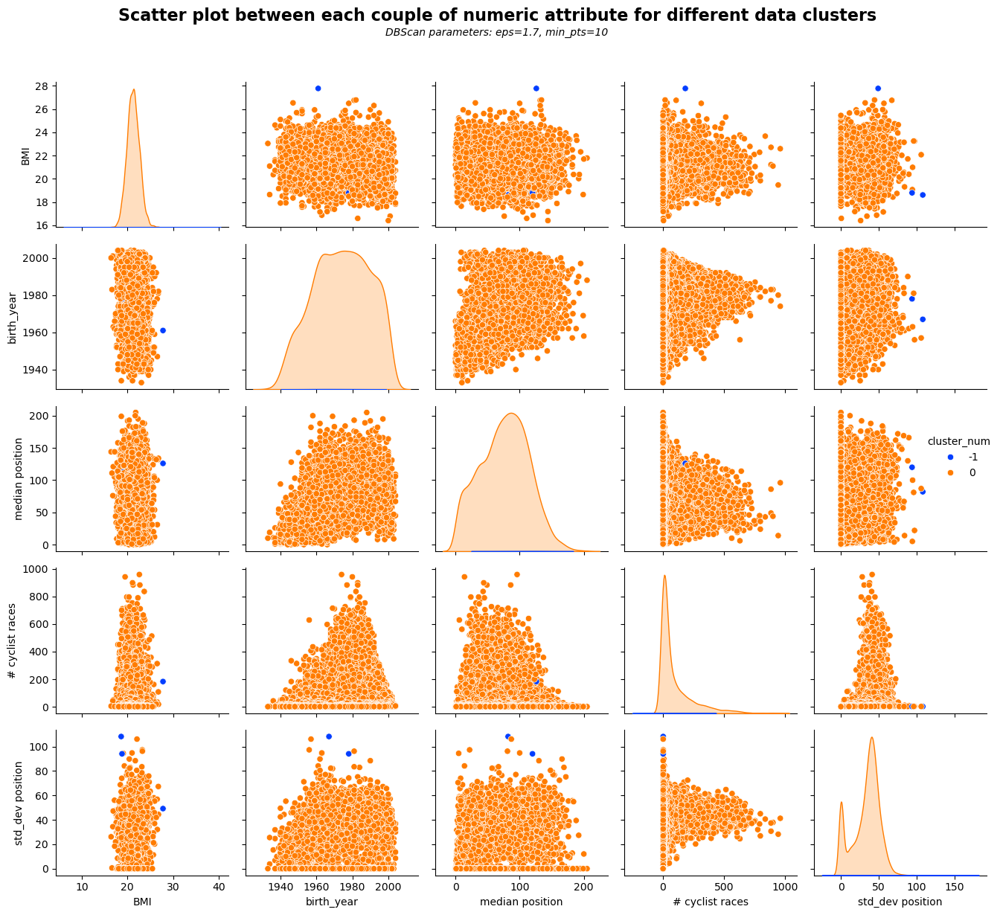

In [20]:
pairplot=sbn.pairplot(cyclists[columns+['cluster_num']], hue='cluster_num', palette='bright')
pairplot.figure.suptitle("Scatter plot between each couple of numeric attribute for different data clusters", 
                      fontweight='bold', size=16)
pairplot.figure.text(0.5, 0.95, f"DBScan parameters: eps={1.7}, min_pts={10}", 
                     ha='center', fontsize=10, style='italic')
pairplot.figure.tight_layout()
pairplot.figure.subplots_adjust(top=0.90)
for ax in pairplot.axes.flat:
    if ax.get_legend():
        ax.get_legend().set_bbox_to_anchor((1.2, 1))  # Moves the legend to the right
        ax.get_legend().set_title("Cluster:")
plt.show()
plt.close()

In [21]:
cyclists[dbscan.labels_==-1]

,name,BMI,median position,AVG position,# cyclist races,nationality,continent,geo area,birth_year,AVG weighted position,AVG position Autumn,AVG position Spring,AVG position Summer,AVG position Winter,AVG position Q1,AVG position Q2,AVG position Q3,AVG position Q4,std_dev position,cluster_num
3001,gerrit-solleveld,27.770000,126,114,183,Netherlands,Europe,Western Europe,1961.0,120,NaN,59.0,124.0,58.0,54.0,71.0,125.0,NaN,49.174745,-1
4432,nikolai-galitchanin,18.613691,82,82,2,Russia,Asia,Asia,1967.0,151,NaN,82.0,NaN,NaN,NaN,82.0,NaN,NaN,108.187338,-1
5770,nicola-gavazzi,18.796733,120,120,2,Italy,Europe,Southern Europe,1978.0,144,187.0,54.0,NaN,NaN,NaN,54.0,187.0,NaN,94.045202,-1


We can characterize this noisy points as cyclist with a extremely high/low BMI compared to the others and with very poor performance.

This first "random" choice of the parameters has produced a single cluster, so let's try different combination fro the parameters. <br>  As already told, in order to find a good value for the _eps_ parameter, we can use the elbow method. In this case the idea is that, for points in a cluster, their k-th nearest neighbours are at roughly the same distance. So we can plot the sorted distances of every point to its k-th nearest neighbour

In [22]:
def ElbowMethodForDBSCAN(min_samples, dataframe, horizontal_lines=None, m='euclidean'):
    k = min_samples

    # Determine the distances of the k-NN
    neighbors = NearestNeighbors(n_neighbors=k, metric=m)
    neighbors_fit = neighbors.fit(dataframe)
    # Returns indices of and distances to the neighbors of each point.
    distances, indices = neighbors_fit.kneighbors(dataframe)
    # Sort the distances
    distances = np.sort(distances[:, k-1])

    plt.figure(figsize=(8, 6))
    plt.plot(distances, color='blue')
    plt.xlabel(f'Points sorted according to the Distance of the {k}_th-NN')
    plt.ylabel(f'{k}th-NN Distance')
    plt.title(r'Elbow method to determine the $\it{eps}$ parameter in DBSCAN', fontweight='bold')

    # Draw multiple horizontal lines, if provided, with different colors and a specific label in the legend
    if horizontal_lines is not None:
        for i, y in enumerate(horizontal_lines):
            plt.axhline(y=y, linestyle='--', label=f'Candidate eps at {y:.4f}', color=f'C{i+1}')

    plt.legend()
    plt.show() 

In [23]:
def DBScanPlots(cluster_labels, dataset, label_column, columns_for_clustering, eps_param, min_samples_param):
    # Define a consistent color palette for the clusters for all the following plots
    num_clusters = len(cluster_labels)
    palette = sbn.color_palette("bright", num_clusters)
    cluster_color_map = {label: palette[i] for i, label in enumerate(cluster_labels)}

    #-----PIE CHART-----

    # Create a pie chart showing the distribution of records between clusters
    cluster_counts = dataset[label_column].value_counts()  # Get counts per cluster
    cluster_colors = [cluster_color_map[label] for label in cluster_counts.index]  # Match colors to clusters

    fig, ax = plt.subplots()
    wedges, texts, autotexts = plt.pie(cluster_counts, explode= np.full(len(cluster_counts), 0.15), labels=None,
        autopct='%1.1f%%', startangle=90, pctdistance=0.8, colors=cluster_colors, wedgeprops={'edgecolor': 'black'})
    ax.legend(wedges, cluster_counts.index, title="Clusters", loc="center left", bbox_to_anchor=(1, 0.5))
    plt.title('Distribution of data objects between clusters', fontweight='bold')
    plt.show()

    #-----SCATTER PLOT WITH CLUSTER LABELS-----
        
    #Show the scatterplot between each numeric attribute of the original dataset, labeling using the cluster num
    pairplot=sbn.pairplot(dataset[columns_for_clustering+[label_column]], hue='cluster_num', palette=cluster_color_map)
    pairplot.figure.suptitle("Scatter plot between each couple of numeric attribute per cluster", fontweight='bold', size=16)
    pairplot.figure.text(0.5, 0.947, f"DBScan parameters: eps={eps_param}, min_pts={min_samples_param}", ha='center', fontsize=10, style='italic')

    # handles = pairplot._legend_data.values()
    # labels = pairplot._legend_data.keys()
    # # Aggiunta della legenda nella parte inferiore
    # pairplot.fig.legend(
    #     handles=handles,
    #     labels=labels,
    #     loc='lower center',  # Posiziona la legenda in basso
    #     ncol=len(labels),    # Espandi la legenda in una sola riga
    #     title="Clusters"     # Aggiungi un titolo alla legenda
    # )

    pairplot.fig.subplots_adjust(bottom=0.8)  # Adjust the bot margin to make space for the legend
    pairplot.figure.tight_layout()
    pairplot.figure.subplots_adjust(top=0.9)  # Adjust top margin to make space for the titles
    plt.show()
    plt.close()

In [24]:
def DBSCANIteration(eps_param, min_samples_param, std_dataset, dataset, columns_for_clustering, m='euclidean', plots=False):
    # Execute the DBSCAN Algorithm
    print(f"----- DBSCAN Execution (eps={eps_param}, min_sample={min_samples_param}) -----")
    dbscan=DBSCAN(eps=eps_param, min_samples=min_samples_param, metric=m)
    dbscan.fit(std_dataset)

    #Print the number of clusters with relative sizes
    unique_labels, counts = np.unique(dbscan.labels_, return_counts=True)
    print("Clustering composition:")
    for label, count in zip(unique_labels, counts): #zip yields tuples until the input is finished
        if label == -1:
            print(f"\tNoise: {count} points ({round(count*100/std_dataset.shape[0],2)}%)")
        else:
            print(f"\tCluster #{label}: {count} points ({round(count*100/std_dataset.shape[0],2)}%)")

    #Determine the silhouette score
    labels_filtered = dbscan.labels_[dbscan.labels_ != -1]
    data_filtered = std_dataset[dbscan.labels_ != -1]
    if(len(np.unique(dbscan.labels_))>2): #silhouette not determinable with only 1 cluster
        print(f"Silhouette score without noise: {silhouette_score(data_filtered, labels_filtered, metric=m)}")
        print(f"Silhouette score: {silhouette_score(std_dataset, dbscan.labels_, metric=m)}")

    #Assign a label to each record of the original dataset
    dataset['cluster_num'] = dbscan.labels_

    if plots:
        DBScanPlots(unique_labels, dataset, 'cluster_num', columns_for_clustering, eps_param, min_samples_param)
    
    #return the labels in order to compute some statistics on the cluster
    return dbscan.labels_

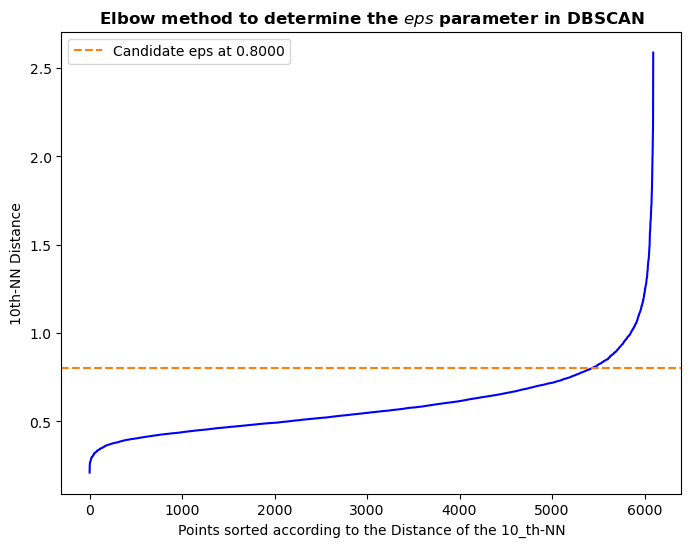

In [25]:
ElbowMethodForDBSCAN(10, std_numeric_cyclists[columns], horizontal_lines=[0.8])

----- DBSCAN Execution (eps=0.8, min_sample=10) -----
Clustering composition:
	Noise: 227 points (3.72%)
	Cluster #0: 5868 points (96.28%)


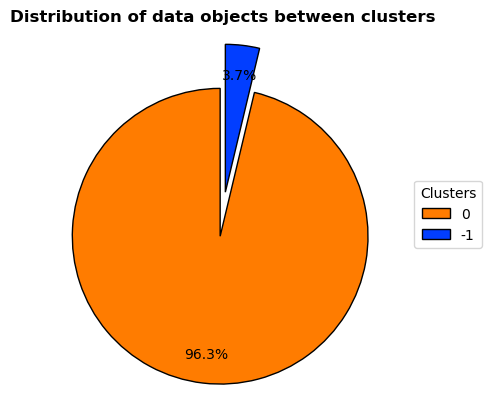

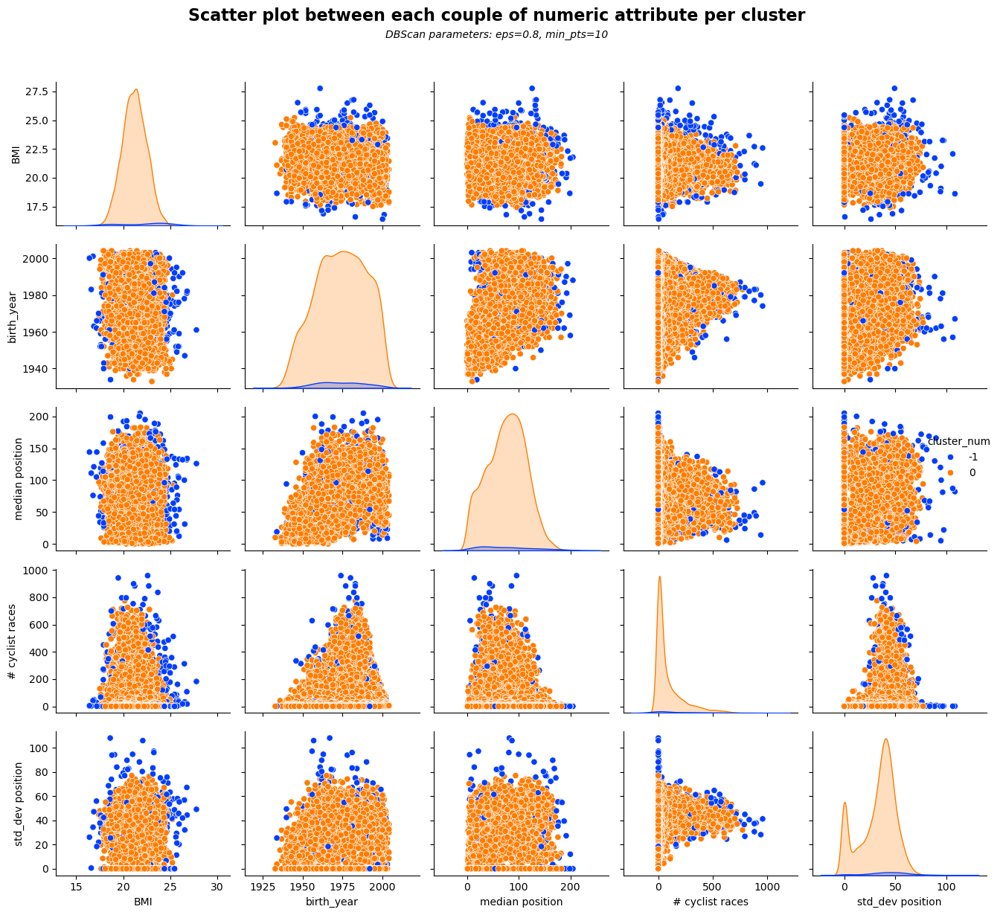

array([-1,  0,  0, ..., -1,  0,  0], dtype=int64)

In [26]:
DBSCANIteration(0.8, 10, std_numeric_cyclists[columns], cyclists, columns, plots=True)

Not a very good clustering because there is not a clear interpretation of this enormous cluster and there is a extreme difference in size. Anyway the noise points, with very different characteristics compared to the other points, are correctly defined. Since there is a very dense "central" region finding the optimal parameters is not trivial. Let's try different values of min_points and eps.

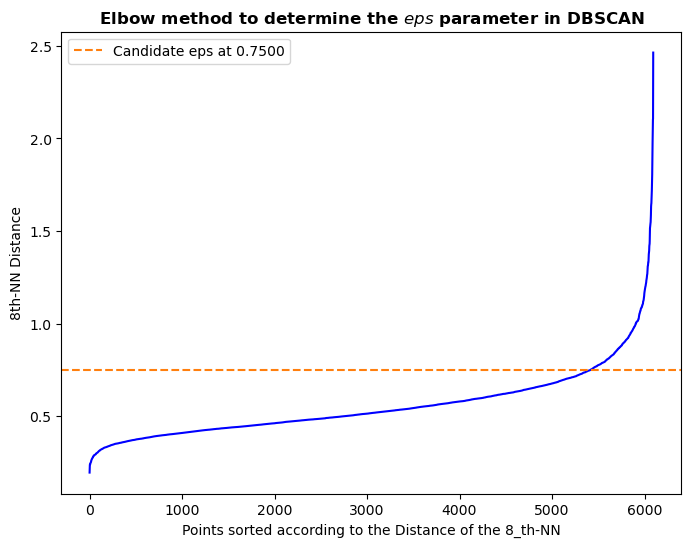

In [27]:
#From min_pts=10-->8
ElbowMethodForDBSCAN(8, std_numeric_cyclists[columns], horizontal_lines=[0.75])

In [28]:
DBSCANIteration(0.75, 8, std_numeric_cyclists[columns], cyclists, columns)

----- DBSCAN Execution (eps=0.75, min_sample=8) -----
Clustering composition:
	Noise: 258 points (4.23%)
	Cluster #0: 5831 points (95.67%)
	Cluster #1: 6 points (0.1%)
Silhouette score without noise: 0.18873032951445498
Silhouette score: 0.14767484750083698


array([-1,  0,  0, ..., -1,  0,  0], dtype=int64)

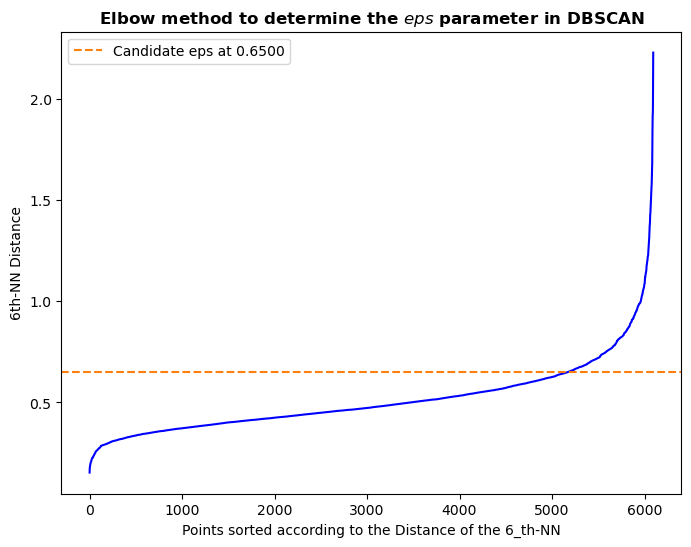

In [29]:
#From min_pts=8-->6
ElbowMethodForDBSCAN(6, std_numeric_cyclists[columns], horizontal_lines=[0.65])

In [30]:
DBSCANIteration(0.65, 6, std_numeric_cyclists[columns], cyclists, columns)

----- DBSCAN Execution (eps=0.65, min_sample=6) -----
Clustering composition:
	Noise: 423 points (6.94%)
	Cluster #0: 5664 points (92.93%)
	Cluster #1: 8 points (0.13%)
Silhouette score without noise: 0.20894865175560492
Silhouette score: 0.13598287101560644


array([-1, -1,  0, ..., -1,  0,  0], dtype=int64)

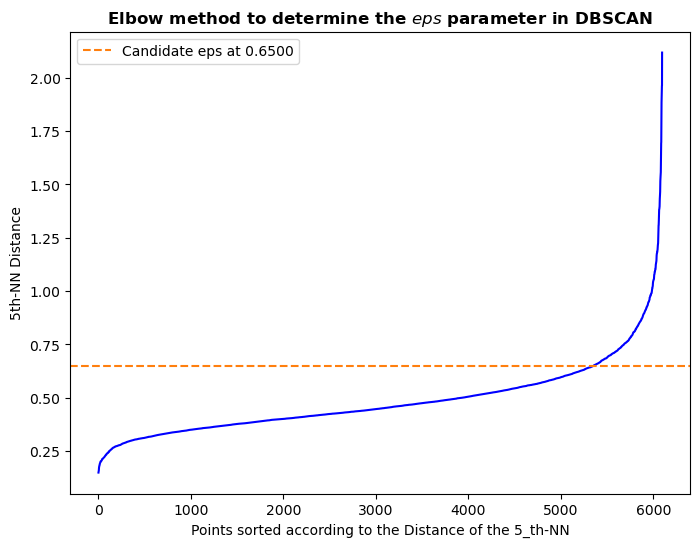

In [31]:
#From min_pts=6-->5 (=dimensionality)
ElbowMethodForDBSCAN(5, std_numeric_cyclists[columns], horizontal_lines=[0.65])

In [32]:
DBSCANIteration(0.625, 5, std_numeric_cyclists[columns], cyclists, columns, plots=False)

----- DBSCAN Execution (eps=0.625, min_sample=5) -----
Clustering composition:
	Noise: 440 points (7.22%)
	Cluster #0: 5638 points (92.5%)
	Cluster #1: 4 points (0.07%)
	Cluster #2: 3 points (0.05%)
	Cluster #3: 4 points (0.07%)
	Cluster #4: 6 points (0.1%)
Silhouette score without noise: 0.017362460787983282
Silhouette score: -0.013277567201260852


array([-1, -1,  0, ..., -1,  0,  0], dtype=int64)

So far, we have only been able to obtain a single cluster or at most very few clusters. In order to evaluate the goodness of the obtained clustering we use the **Silhouette** score which combines the ideas of **Cohesion** (_similar data should be close eachother_) and **Separation** (_data of different clusters should be well separated_). Notice that the DBScan generates also a cluster with label '-1' which contains the noise points. Taking this noise cluster into account when calculating the Silhouette score will have a negative effect on this value, as it is not a real cluster and contains a lot of sparse data. Perhaps it will be more difficult to evaluate the quality of the clustering. So we can try to exclude this 'anomalous' cluster from the evaluation.

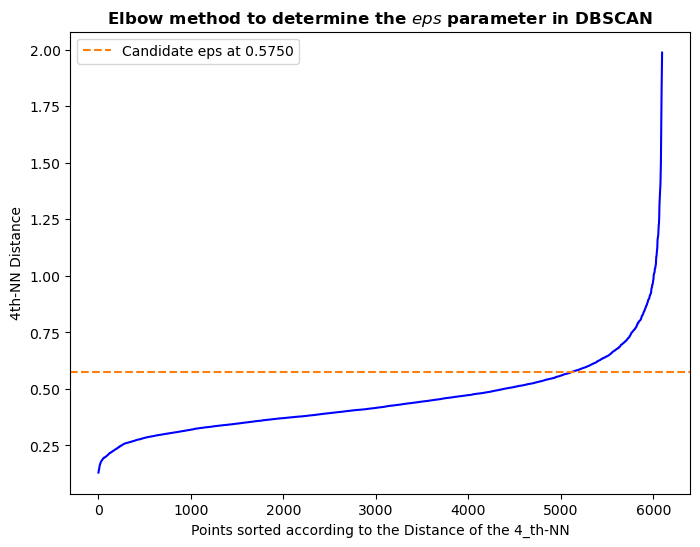

In [33]:
#Since there is a very dense region let's try to reduce again min_pts=5-->4 (=dimensionality)
ElbowMethodForDBSCAN(4, std_numeric_cyclists[columns], horizontal_lines=[0.575])

----- DBSCAN Execution (eps=0.575, min_sample=4) -----
Clustering composition:
	Noise: 557 points (9.14%)
	Cluster #0: 5490 points (90.07%)
	Cluster #1: 4 points (0.07%)
	Cluster #2: 8 points (0.13%)
	Cluster #3: 3 points (0.05%)
	Cluster #4: 3 points (0.05%)
	Cluster #5: 4 points (0.07%)
	Cluster #6: 3 points (0.05%)
	Cluster #7: 4 points (0.07%)
	Cluster #8: 7 points (0.11%)
	Cluster #9: 4 points (0.07%)
	Cluster #10: 4 points (0.07%)
	Cluster #11: 4 points (0.07%)
Silhouette score without noise: -0.24769958493977662
Silhouette score: -0.27205937234301053


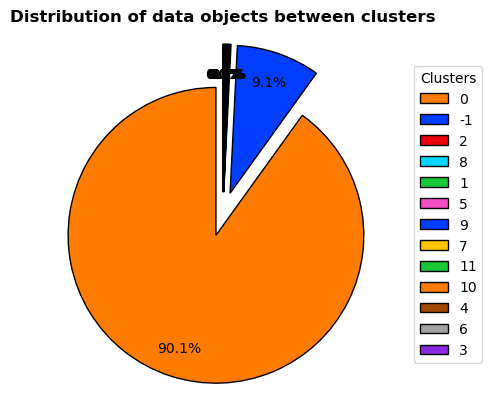

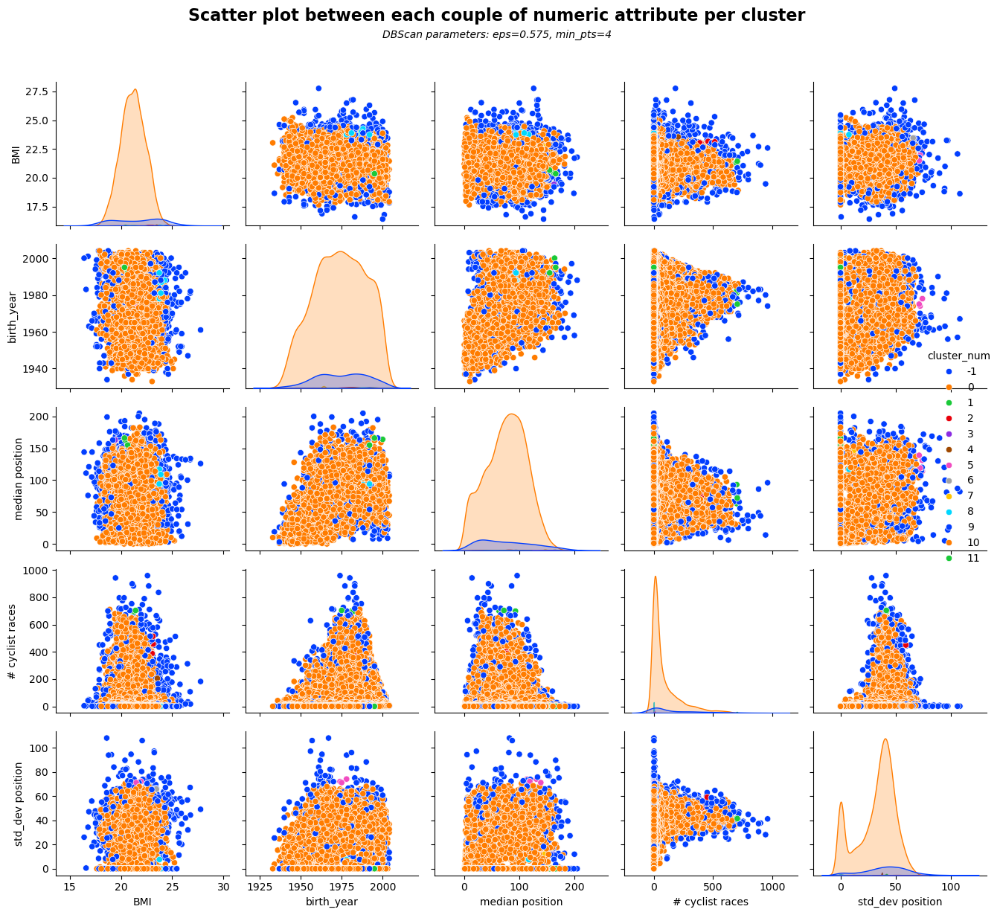

array([-1, -1,  0, ..., -1,  0,  0], dtype=int64)

In [34]:
DBSCANIteration(0.575, 4, std_numeric_cyclists[columns], cyclists, columns, plots=True)

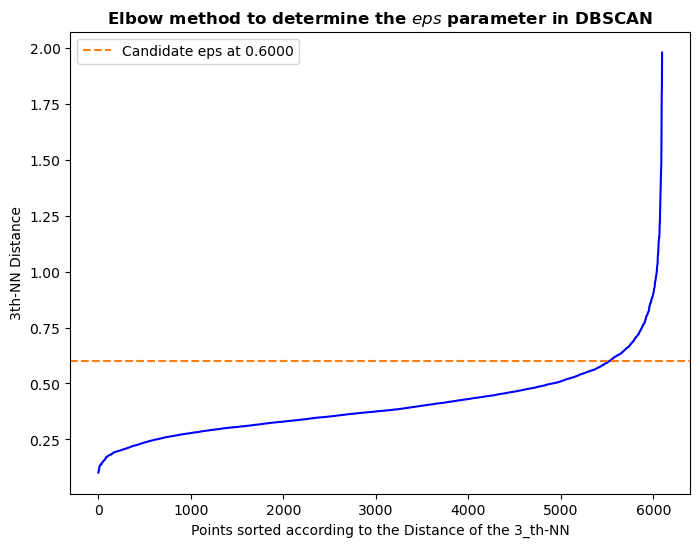

In [35]:
#min_pts=4-->3
ElbowMethodForDBSCAN(3, std_numeric_cyclists[columns], horizontal_lines=[0.60])

----- DBSCAN Execution (eps=0.6, min_sample=3) -----
Clustering composition:
	Noise: 379 points (6.22%)
	Cluster #0: 5659 points (92.85%)
	Cluster #1: 3 points (0.05%)
	Cluster #2: 3 points (0.05%)
	Cluster #3: 3 points (0.05%)
	Cluster #4: 5 points (0.08%)
	Cluster #5: 3 points (0.05%)
	Cluster #6: 3 points (0.05%)
	Cluster #7: 3 points (0.05%)
	Cluster #8: 4 points (0.07%)
	Cluster #9: 3 points (0.05%)
	Cluster #10: 3 points (0.05%)
	Cluster #11: 3 points (0.05%)
	Cluster #12: 7 points (0.11%)
	Cluster #13: 3 points (0.05%)
	Cluster #14: 4 points (0.07%)
	Cluster #15: 3 points (0.05%)
	Cluster #16: 4 points (0.07%)
Silhouette score without noise: -0.2379243489215932
Silhouette score: -0.25710034489896966


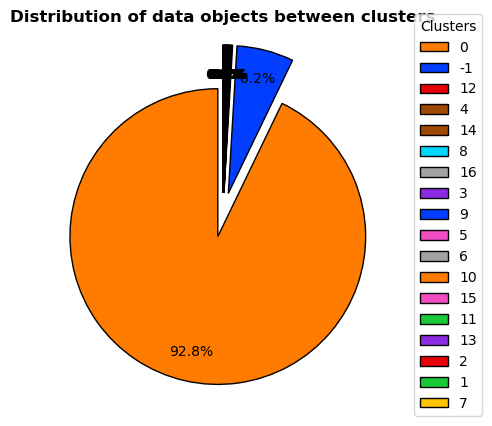

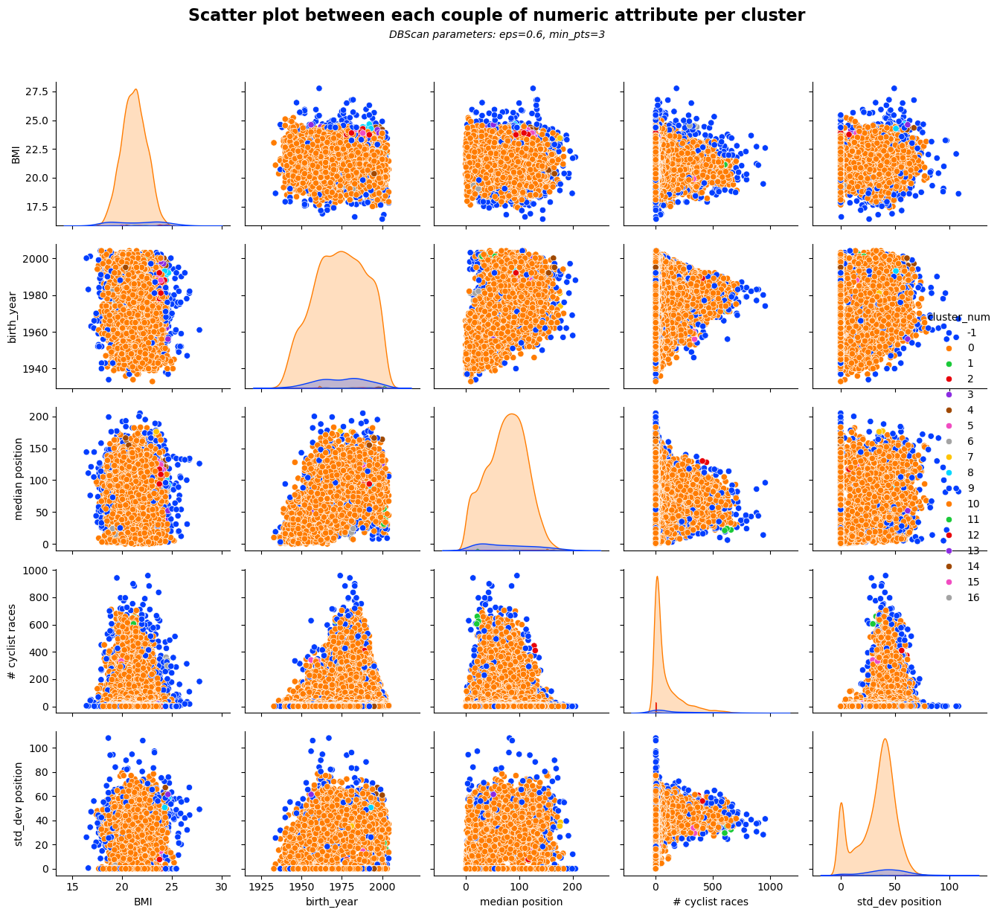

array([-1, -1,  0, ..., -1,  0,  0], dtype=int64)

In [36]:
DBSCANIteration(0.6, 3, std_numeric_cyclists[columns], cyclists, columns, plots=True)

By reducing the parameter min_pts we tried to capture small clusters with less points, compared to the main big one, but with a particular meaning. Anyway we obtained irrelevant clusters with at most 10 points over about 6000. We can try the opposite strategy which means increase min_points to capture denser clusters.

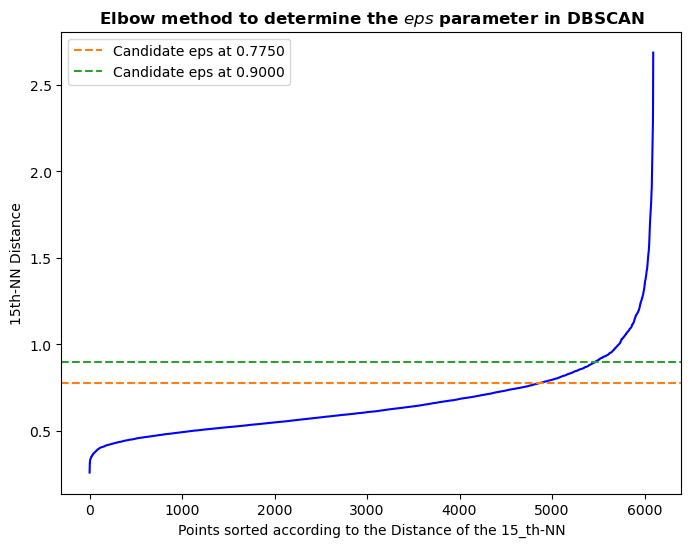

In [37]:
#Let's try the opposite strategy, increase min_pts
ElbowMethodForDBSCAN(15, std_numeric_cyclists[columns], horizontal_lines=[0.775, 0.9])

In [38]:
DBSCANIteration(0.775, 15, std_numeric_cyclists[columns], cyclists, columns, plots=False)

----- DBSCAN Execution (eps=0.775, min_sample=15) -----
Clustering composition:
	Noise: 368 points (6.04%)
	Cluster #0: 5727 points (93.96%)


array([-1,  0,  0, ..., -1,  0,  0], dtype=int64)

In [39]:
DBSCANIteration(0.9, 15, std_numeric_cyclists[columns], cyclists, columns, plots=False)

----- DBSCAN Execution (eps=0.9, min_sample=15) -----
Clustering composition:
	Noise: 154 points (2.53%)
	Cluster #0: 5941 points (97.47%)


array([-1,  0,  0, ..., -1,  0,  0], dtype=int64)

Unfortunately, even if we tried to tune the DBScan parameters, we were not able to find significant clusters. We have highlighted "_noisy_" cyclists, hence those with:
- very different high/low BMI compared to the other cyclists
- with very poor or not consistent performance , expressed by the '_median position_' and  by '_std dev position_'
- with an high number of race participations, since a great number of cyclists have few recorded placements.

Anyway, the silhouette scores for the various clustering tested are quite poor. In fact the scores provided by the function of the library **ScikitLearn** can be interpreted as follows:
- 1.0: Perfect clustering with well separated and compact data.
- above 0.5: Good clustering with well defined clusters.
- 0.0 - 0.5: Overlapping and not so definite clusters. 
- <0.0: Poor clustering.

We can try to find more meaningful clusters by:
- try to reduce the number of features, selecting them using some strategies like the PCA
- try different metrics for the distance like the _Manhattan_ or the _Cosine_. In the previous applications we have used the default _Euclidean_ distance.

### Dimensionality reduction via PCA
It is quite frequent that features of a dataset have a particular correlation. We can exploit the _Principal Cmponent Analysis_ to reduce the dimensionality and avoid high correlated columns. In this case we try to execute the clustering algorithms on the data projected in a less dimentional space, preserving the relevant information of the data (the variance). 

In [40]:
from sklearn.decomposition import PCA

# Try to apply the PCA to get the optimal number of components
pca_instance=PCA(n_components=0.90) #preserve the 90% of the variance
pca_std_numeric_cyclists=pca_instance.fit_transform(std_numeric_cyclists[columns])

print(f"# selected principal components: {pca_instance.n_components_}")

# selected principal components: 4


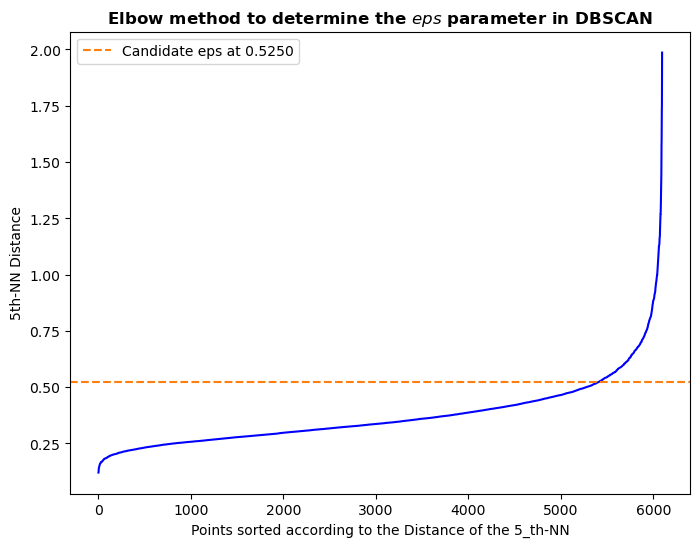

In [41]:
ElbowMethodForDBSCAN(5, pca_std_numeric_cyclists, horizontal_lines=[0.525])

In [42]:
DBSCANIteration(0.525, 5, pca_std_numeric_cyclists, cyclists, columns)

----- DBSCAN Execution (eps=0.525, min_sample=5) -----
Clustering composition:
	Noise: 354 points (5.81%)
	Cluster #0: 5727 points (93.96%)
	Cluster #1: 6 points (0.1%)
	Cluster #2: 8 points (0.13%)
Silhouette score without noise: 0.06496857298531863
Silhouette score: 0.03787064262357989


array([-1,  0,  0, ..., -1,  0,  0], dtype=int64)

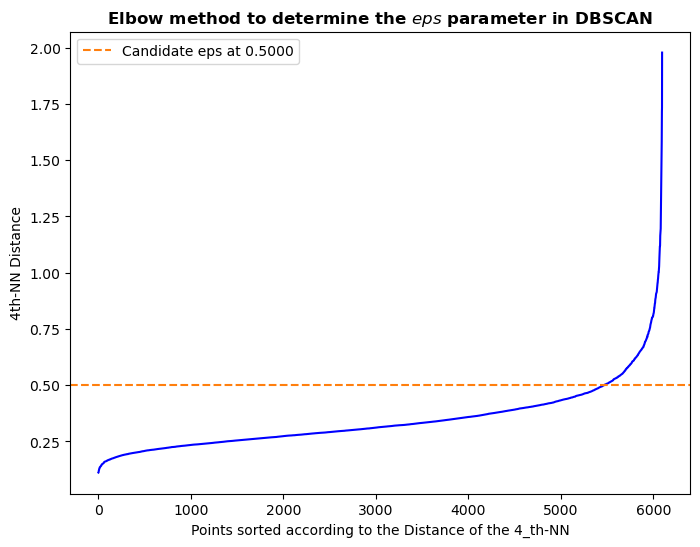

In [43]:
ElbowMethodForDBSCAN(4, pca_std_numeric_cyclists, horizontal_lines=[0.5])

----- DBSCAN Execution (eps=0.5, min_sample=4) -----
Clustering composition:
	Noise: 360 points (5.91%)
	Cluster #0: 5701 points (93.54%)
	Cluster #1: 6 points (0.1%)
	Cluster #2: 5 points (0.08%)
	Cluster #3: 3 points (0.05%)
	Cluster #4: 4 points (0.07%)
	Cluster #5: 7 points (0.11%)
	Cluster #6: 3 points (0.05%)
	Cluster #7: 6 points (0.1%)
Silhouette score without noise: -0.2160261047597739
Silhouette score: -0.23374782761751423


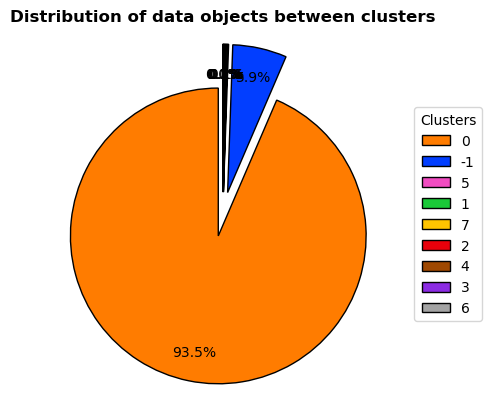

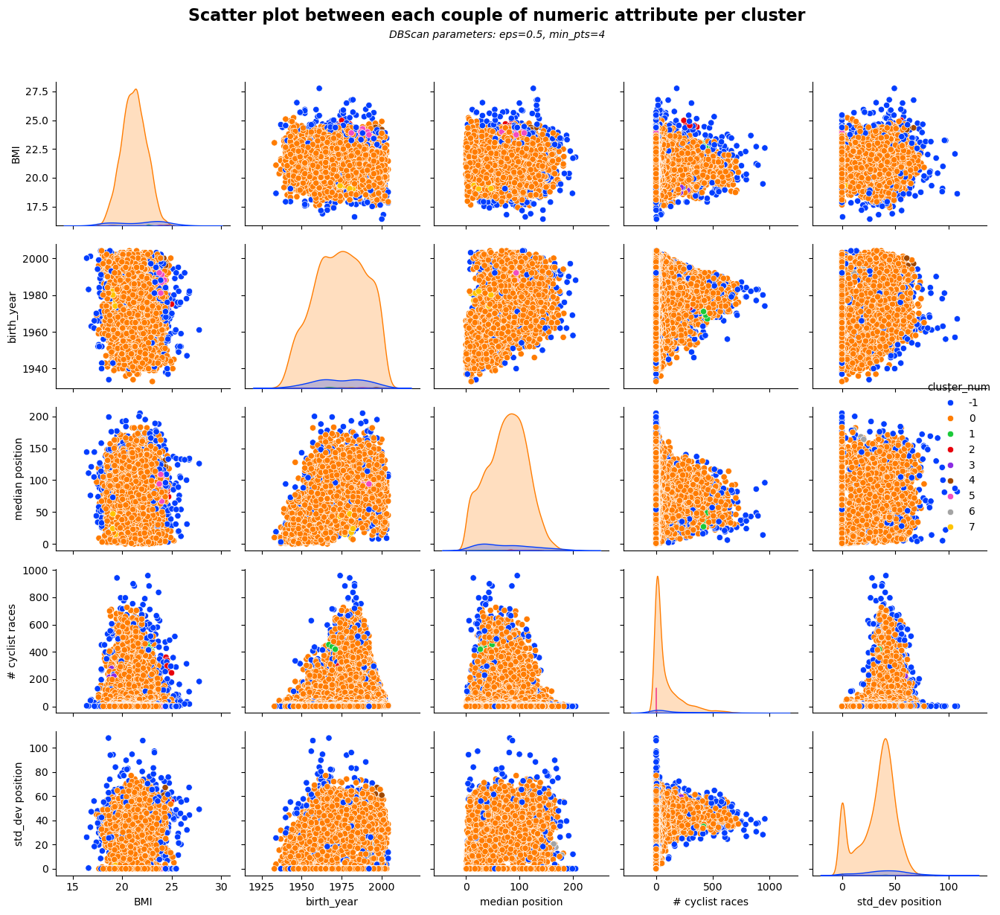

array([-1,  0,  0, ..., -1,  0,  0], dtype=int64)

In [44]:
DBSCANIteration(0.5, 4, pca_std_numeric_cyclists, cyclists, columns, plots=True)

In [45]:
pca_instance=PCA(n_components=0.75) #preserve the 80% of the variance
pca_std_numeric_cyclists=pca_instance.fit_transform(std_numeric_cyclists[columns])

print(f"# selected principal components: {pca_instance.n_components_}")

# selected principal components: 3


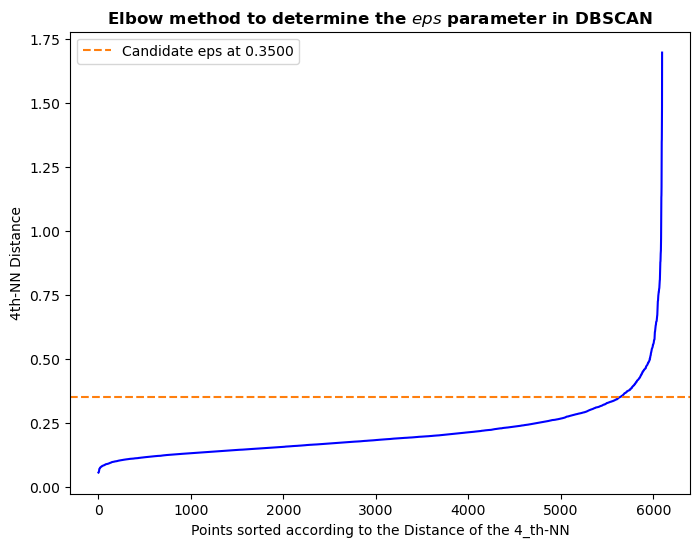

In [46]:
ElbowMethodForDBSCAN(4, pca_std_numeric_cyclists, horizontal_lines=[0.35])

In [47]:
DBSCANIteration(0.35, 4, pca_std_numeric_cyclists, cyclists, columns, plots=False)

----- DBSCAN Execution (eps=0.35, min_sample=4) -----
Clustering composition:
	Noise: 265 points (4.35%)
	Cluster #0: 5764 points (94.57%)
	Cluster #1: 5 points (0.08%)
	Cluster #2: 8 points (0.13%)
	Cluster #3: 8 points (0.13%)
	Cluster #4: 6 points (0.1%)
	Cluster #5: 4 points (0.07%)
	Cluster #6: 4 points (0.07%)
	Cluster #7: 4 points (0.07%)
	Cluster #8: 5 points (0.08%)
	Cluster #9: 4 points (0.07%)
	Cluster #10: 4 points (0.07%)
	Cluster #11: 7 points (0.11%)
	Cluster #12: 3 points (0.05%)
	Cluster #13: 4 points (0.07%)
Silhouette score without noise: -0.23870902629916813
Silhouette score: -0.2568427686093882


array([-1, -1,  0, ..., -1,  0,  0], dtype=int64)

Also this approach actually have not produced meaningful clusters and have a poor silhouette score. Let's try to manually eliminate some columns and let's see what happens.

### Dimensionality reduction via manual trimming

##### ['median position', '# cyclist races', 'std_dev position']

In [48]:
trimmed_columns=['median position', '# cyclist races', 'std_dev position']

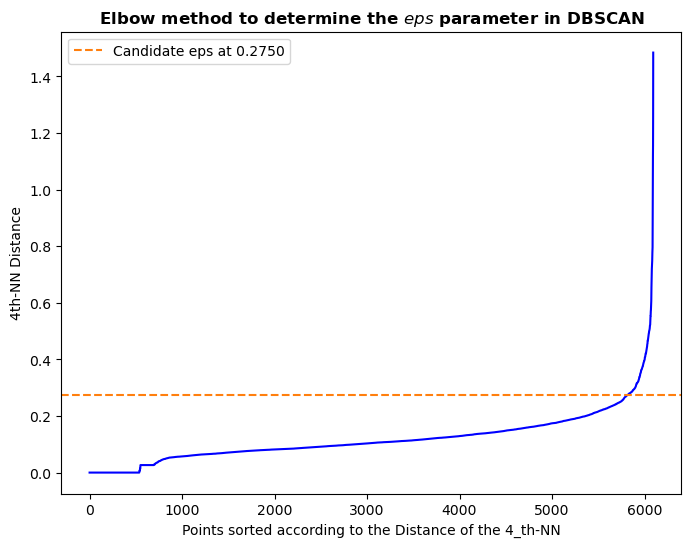

In [49]:
ElbowMethodForDBSCAN(4, std_numeric_cyclists[trimmed_columns], horizontal_lines=[0.275])

----- DBSCAN Execution (eps=0.275, min_sample=4) -----
Clustering composition:
	Noise: 169 points (2.77%)
	Cluster #0: 5900 points (96.8%)
	Cluster #1: 4 points (0.07%)
	Cluster #2: 4 points (0.07%)
	Cluster #3: 6 points (0.1%)
	Cluster #4: 4 points (0.07%)
	Cluster #5: 4 points (0.07%)
	Cluster #6: 4 points (0.07%)
Silhouette score without noise: 0.033506408132404984
Silhouette score: 0.01631559938632894


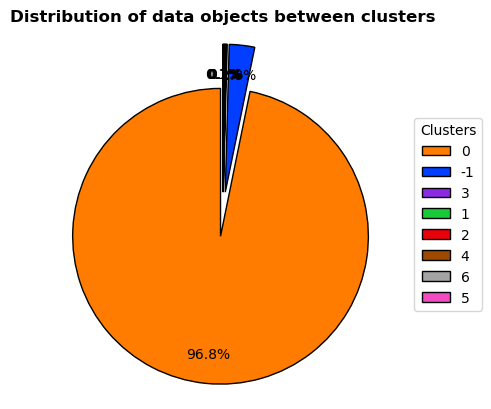

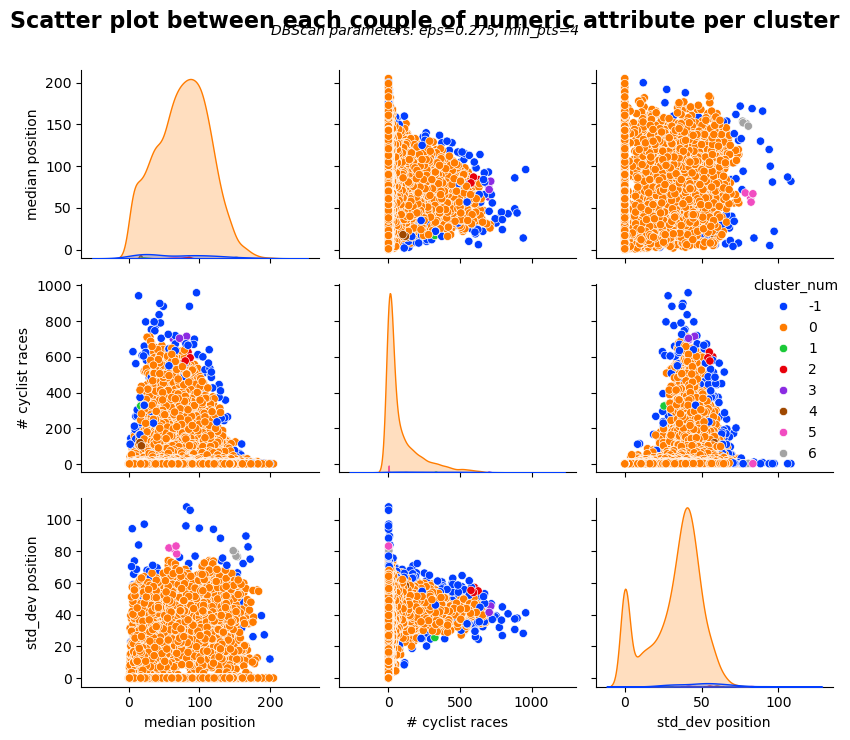

array([-1,  0,  0, ...,  0,  0,  0], dtype=int64)

In [50]:
DBSCANIteration(0.275, 4, std_numeric_cyclists[trimmed_columns], cyclists, trimmed_columns, plots=True)

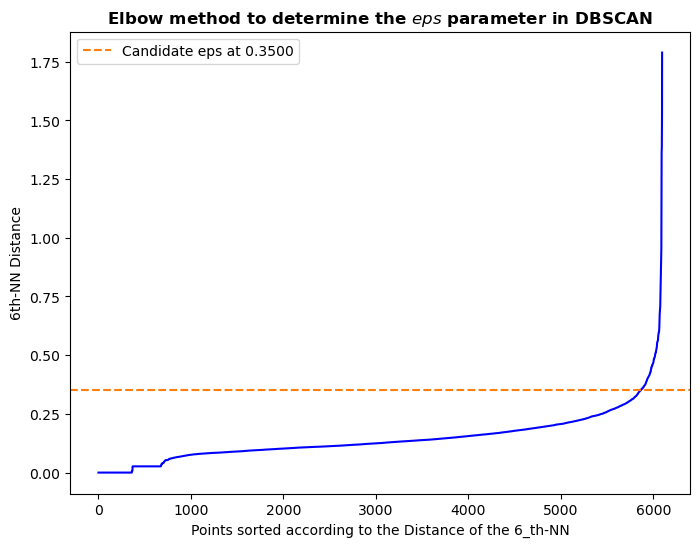

In [51]:
ElbowMethodForDBSCAN(6, std_numeric_cyclists[trimmed_columns], horizontal_lines=[0.35])

----- DBSCAN Execution (eps=0.35, min_sample=6) -----
Clustering composition:
	Noise: 126 points (2.07%)
	Cluster #0: 5963 points (97.83%)
	Cluster #1: 6 points (0.1%)
Silhouette score without noise: 0.49831952018791653
Silhouette score: 0.35340369246079434


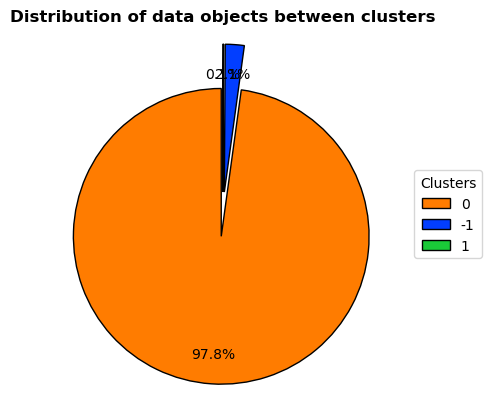

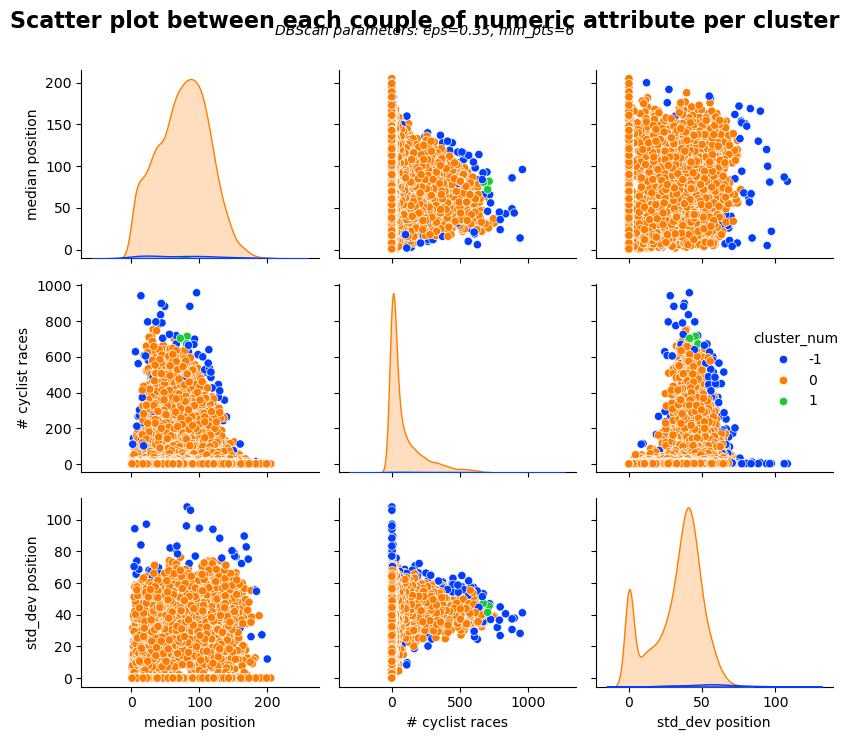

array([-1,  0,  0, ...,  0,  0,  0], dtype=int64)

In [52]:
DBSCANIteration(0.35, 6, std_numeric_cyclists[trimmed_columns], cyclists, trimmed_columns, plots=True)

Even if the silhouette score is quite high (0.4) there is a big cluster of 98% of the points and a small cluster with the 0.1% of points. It's difficult to determine smaller and well defined clusters in this situation.

**GRID SEARCH**

Since we have not found any good clustering during the various tests, we try to perform some grid search in order to find the best combination of the two parameters considering more distance measures like the **cosine**, **euclidean**, **manhattan**.

**DISTANCES**: <br>
--> **Manhattan Distance (L1-norm)**
The Manhattan Distance is the sum of the absolute differences between the coordinates of two points:
$$
d_{\text{Manhattan}}(P, Q) = \sum_{i=1}^{n} |P_i - Q_i|
$$

--> **Cosine Distance**
The Cosine Distance measures the angle between two vectors and is defined as:
$$
d_{\text{Cosine}}(P, Q) = 1 - \frac{P \cdot Q}{\|P\| \|Q\|}
$$
where the numerator is the dot product between P and Q while the denominator |P| is the norm (length) of vector P.

--> **Euclidean Distance (L2-norm)**
The Euclidean Distance is the square root of the sum of the squares of the differences between the coordinates:
$$
d_{\text{Euclidean}}(P, Q) = \sqrt{\sum_{i=1}^{n} (P_i - Q_i)^2}
$$

In [53]:
def GridSearchDBSCAN(dataset, eps_lb, eps_ub, min_pts_lb, min_pts_ub, eps_step):
    # Keep only the top 10 best results
    top_results = []

    metrics = {'manhattan', 'cosine', 'euclidean'}
    for eps in np.linspace(eps_lb, eps_ub, int((eps_ub - eps_lb) / eps_step) + 1):  # Interval for eps in [lb, ub] with a step of eps_step
        for min_samples in range(min_pts_lb, min_pts_ub):  # Interval for min_samples in [lb, ub) with a step of 1
            for m in metrics:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=m)
                labels = dbscan.fit_predict(dataset)
                
                # Avoid situations where there's only one cluster + 1 noise cluster
                if len(set(labels)) > 3:  
                    labels_filtered = dbscan.labels_[dbscan.labels_ != -1]
                    data_filtered = dataset[dbscan.labels_ != -1]
                    
                    # Silhouette without considering the noise
                    score = silhouette_score(data_filtered, labels_filtered, metric=m)
                    result = {
                        'score': score,
                        'eps': eps,
                        'min_samples': min_samples,
                        'metric': m,
                        'clusters': len(set(labels)) - 1  # Removes the '-1' noise class
                    }
                    print(f"Metric: {result['metric']} Eps: {result['eps']} min_samples: {result['min_samples']} #Clusters: {result['clusters']} Score: {result['score']:.4f}\n")
                    # Add the result to the list
                    if len(top_results) < 10:
                        top_results.append(result)
                    else:
                        # Replace the worst result if the current one is better
                        min_score_idx = min(range(len(top_results)), key=lambda i: top_results[i]['score'])
                        if score > top_results[min_score_idx]['score']:
                            top_results[min_score_idx] = result

    # Sort the top results by score in descending order
    top_results = sorted(top_results, key=lambda x: x['score'], reverse=True)

    # Print the top 10 results
    print("----- Top 10 DBSCAN Parameters computed via a Grid Search-----")
    print(f"Constrained search for eps in [{eps_lb}, {eps_ub}] and min_pts in [{min_pts_lb}, {min_pts_ub}]")
    for i, result in enumerate(top_results):
        print(f"Rank {i+1}:")
        print(f"\tMetric: {result['metric']}")
        print(f"\tEps: {result['eps']}")
        print(f"\tmin_samples: {result['min_samples']}")
        print(f"\tNumber of clusters: {result['clusters']}")
        print(f"\tSilhouette Score: {result['score']:.4f}\n")


In [91]:
GridSearchDBSCAN(std_numeric_cyclists[trimmed_columns], 0.2, 0.4, 4, 6, 0.005)

Metric: euclidean Eps: 0.2 min_samples: 4 #Clusters: 29 Score: -0.3557

Metric: manhattan Eps: 0.2 min_samples: 4 #Clusters: 65 Score: -0.4449

Metric: euclidean Eps: 0.2 min_samples: 5 #Clusters: 20 Score: -0.3199

Metric: manhattan Eps: 0.2 min_samples: 5 #Clusters: 42 Score: -0.4046

Metric: euclidean Eps: 0.20500000000000002 min_samples: 4 #Clusters: 27 Score: -0.3500

Metric: manhattan Eps: 0.20500000000000002 min_samples: 4 #Clusters: 57 Score: -0.4732

Metric: euclidean Eps: 0.20500000000000002 min_samples: 5 #Clusters: 18 Score: -0.3076

Metric: manhattan Eps: 0.20500000000000002 min_samples: 5 #Clusters: 44 Score: -0.4440

Metric: euclidean Eps: 0.21000000000000002 min_samples: 4 #Clusters: 27 Score: -0.3489

Metric: manhattan Eps: 0.21000000000000002 min_samples: 4 #Clusters: 53 Score: -0.4170

Metric: euclidean Eps: 0.21000000000000002 min_samples: 5 #Clusters: 18 Score: -0.3042

Metric: manhattan Eps: 0.21000000000000002 min_samples: 5 #Clusters: 40 Score: -0.4531

Metric: 

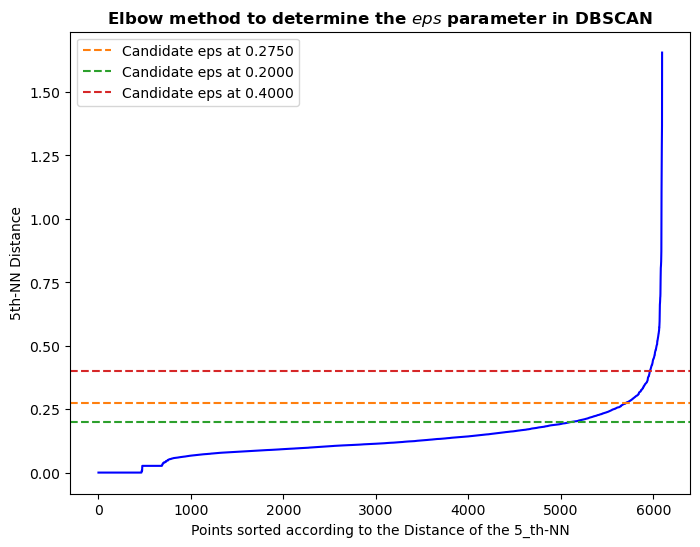

In [54]:
#Select the top combination [Metric: euclidean, Eps: 0.275, min_samples: 5,	# Clusters: 3 Sil. Score: 0.3877]
ElbowMethodForDBSCAN(5, std_numeric_cyclists[trimmed_columns], horizontal_lines=[0.275, 0.2, 0.4], m='euclidean')

----- DBSCAN Execution (eps=0.275, min_sample=5) -----
Clustering composition:
	Noise: 216 points (3.54%)
	Cluster #0: 5870 points (96.31%)
	Cluster #1: 5 points (0.08%)
	Cluster #2: 4 points (0.07%)
Silhouette score without noise: 0.3877289469226046
Silhouette score: 0.2961384509122453


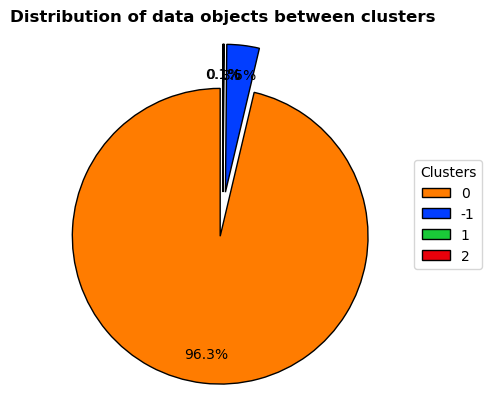

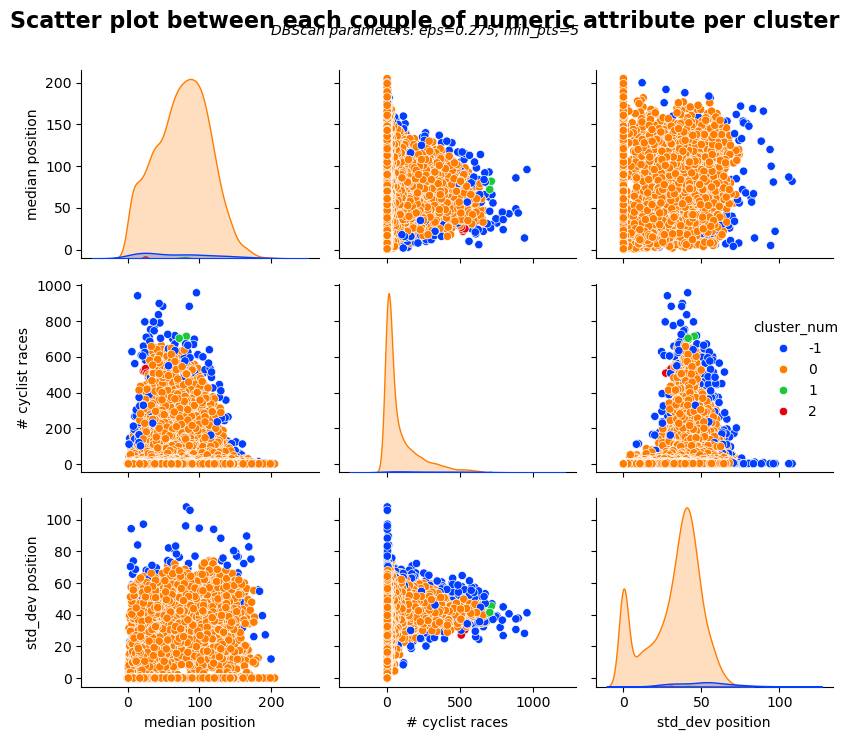

array([-1,  0,  0, ...,  0,  0,  0], dtype=int64)

In [55]:
DBSCANIteration(0.275, 5, std_numeric_cyclists[trimmed_columns], cyclists, trimmed_columns, m='euclidean', plots=True)

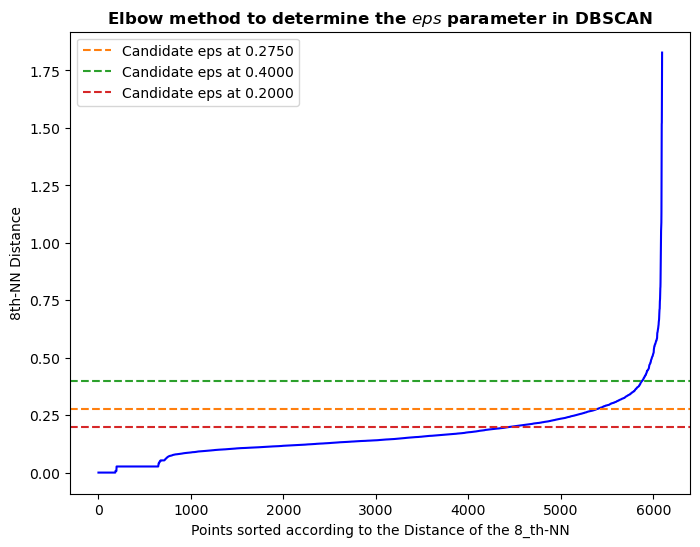

In [56]:
ElbowMethodForDBSCAN(8, std_numeric_cyclists[trimmed_columns], horizontal_lines=[0.275, 0.4, 0.2], m='euclidean')

In [118]:
GridSearchDBSCAN(std_numeric_cyclists[trimmed_columns], 0.2, 0.4, 6, 8, 0.005)

Metric: manhattan Eps: 0.2 min_samples: 6 #Clusters: 37 Score: -0.4687

Metric: euclidean Eps: 0.2 min_samples: 6 #Clusters: 16 Score: -0.1952

Metric: manhattan Eps: 0.2 min_samples: 7 #Clusters: 27 Score: -0.3288

Metric: euclidean Eps: 0.2 min_samples: 7 #Clusters: 12 Score: -0.2595

Metric: manhattan Eps: 0.20500000000000002 min_samples: 6 #Clusters: 36 Score: -0.4301

Metric: euclidean Eps: 0.20500000000000002 min_samples: 6 #Clusters: 17 Score: -0.2350

Metric: manhattan Eps: 0.20500000000000002 min_samples: 7 #Clusters: 32 Score: -0.4543

Metric: euclidean Eps: 0.20500000000000002 min_samples: 7 #Clusters: 14 Score: -0.2696

Metric: manhattan Eps: 0.21000000000000002 min_samples: 6 #Clusters: 33 Score: -0.4515

Metric: euclidean Eps: 0.21000000000000002 min_samples: 6 #Clusters: 19 Score: -0.3178

Metric: manhattan Eps: 0.21000000000000002 min_samples: 7 #Clusters: 29 Score: -0.4873

Metric: euclidean Eps: 0.21000000000000002 min_samples: 7 #Clusters: 14 Score: -0.1472

Metric: 

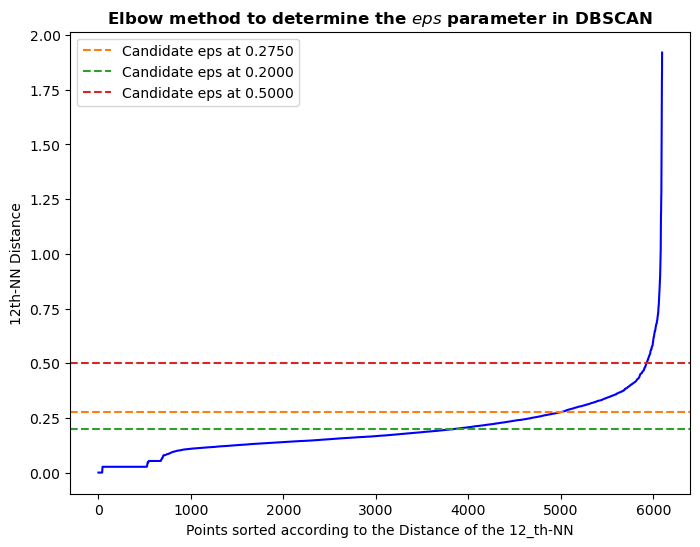

In [57]:
ElbowMethodForDBSCAN(12, std_numeric_cyclists[trimmed_columns], horizontal_lines=[0.275, 0.2, 0.5], m='euclidean')

In [124]:
GridSearchDBSCAN(std_numeric_cyclists[trimmed_columns], 0.1, 0.5, 8, 13, 0.005)

Metric: manhattan Eps: 0.1 min_samples: 8 #Clusters: 12 Score: -0.0430

Metric: euclidean Eps: 0.1 min_samples: 8 #Clusters: 47 Score: -0.0629

Metric: manhattan Eps: 0.1 min_samples: 9 #Clusters: 8 Score: 0.0576

Metric: euclidean Eps: 0.1 min_samples: 9 #Clusters: 43 Score: 0.0067

Metric: manhattan Eps: 0.1 min_samples: 10 #Clusters: 7 Score: 0.0406

Metric: euclidean Eps: 0.1 min_samples: 10 #Clusters: 35 Score: 0.0119

Metric: manhattan Eps: 0.1 min_samples: 11 #Clusters: 3 Score: 0.1623

Metric: euclidean Eps: 0.1 min_samples: 11 #Clusters: 22 Score: -0.0026

Metric: euclidean Eps: 0.1 min_samples: 12 #Clusters: 17 Score: 0.0050

Metric: manhattan Eps: 0.10500000000000001 min_samples: 8 #Clusters: 16 Score: -0.0220

Metric: euclidean Eps: 0.10500000000000001 min_samples: 8 #Clusters: 39 Score: -0.1839

Metric: manhattan Eps: 0.10500000000000001 min_samples: 9 #Clusters: 11 Score: 0.0243

Metric: euclidean Eps: 0.10500000000000001 min_samples: 9 #Clusters: 41 Score: -0.0363

Metri

We notice that by increasing the parameter min_points and adjusting the eps parameter we obtain a larger number of clusters but the silhouette score remains quite low because these clusters are not so well separated. The configurations which allows to get higher scores actually produce few clusters (3 or 4, with a single big cluster and the other small with tenth of points) and that are not so significant.

### Determine _Eps_ parameter w.r.t sample density
Let's try another strategy for determining the eps parameter based on the average concentration of points.

In [58]:
# computing sample densities for DBScan to avoid arbitrary values
# maximum distance between any two points in the dataset
maximum_distance = abs(std_numeric_cyclists[trimmed_columns].max() - std_numeric_cyclists[trimmed_columns].min()).sum().item()
average_concentration = std_numeric_cyclists[trimmed_columns].shape[0] / maximum_distance
print(maximum_distance)
print(average_concentration)
eps_values = average_concentration * np.array([10, 5, 2.5, 1, 0.1, 0.01, 0.0001])
print(eps_values)

18.361305544699015
331.94807336342444
[3.31948073e+03 1.65974037e+03 8.29870183e+02 3.31948073e+02
 3.31948073e+01 3.31948073e+00 3.31948073e-02]


We immediately notice that the radius produced are very high!

In [59]:
for pts in range(3, 20):
    for eps in eps_values:
        DBSCANIteration(eps, pts, std_numeric_cyclists, cyclists, columns, plots=False)

----- DBSCAN Execution (eps=3319.4807336342446, min_sample=3) -----
Clustering composition:
	Cluster #0: 6095 points (100.0%)
----- DBSCAN Execution (eps=1659.7403668171223, min_sample=3) -----
Clustering composition:
	Cluster #0: 6095 points (100.0%)
----- DBSCAN Execution (eps=829.8701834085612, min_sample=3) -----
Clustering composition:
	Cluster #0: 6095 points (100.0%)
----- DBSCAN Execution (eps=331.94807336342444, min_sample=3) -----
Clustering composition:
	Cluster #0: 6095 points (100.0%)
----- DBSCAN Execution (eps=33.19480733634244, min_sample=3) -----
Clustering composition:
	Cluster #0: 6095 points (100.0%)
----- DBSCAN Execution (eps=3.3194807336342445, min_sample=3) -----
Clustering composition:
	Cluster #0: 6095 points (100.0%)
----- DBSCAN Execution (eps=0.03319480733634245, min_sample=3) -----
Clustering composition:
	Noise: 6095 points (100.0%)
----- DBSCAN Execution (eps=3319.4807336342446, min_sample=4) -----
Clustering composition:
	Cluster #0: 6095 points (100.0%

This procedure generates a single cluster because the eps values generated are too high.

### Considerations

In [60]:
columns=['BMI', 'birth_year', 'median position', '# cyclist races', 'std_dev position']

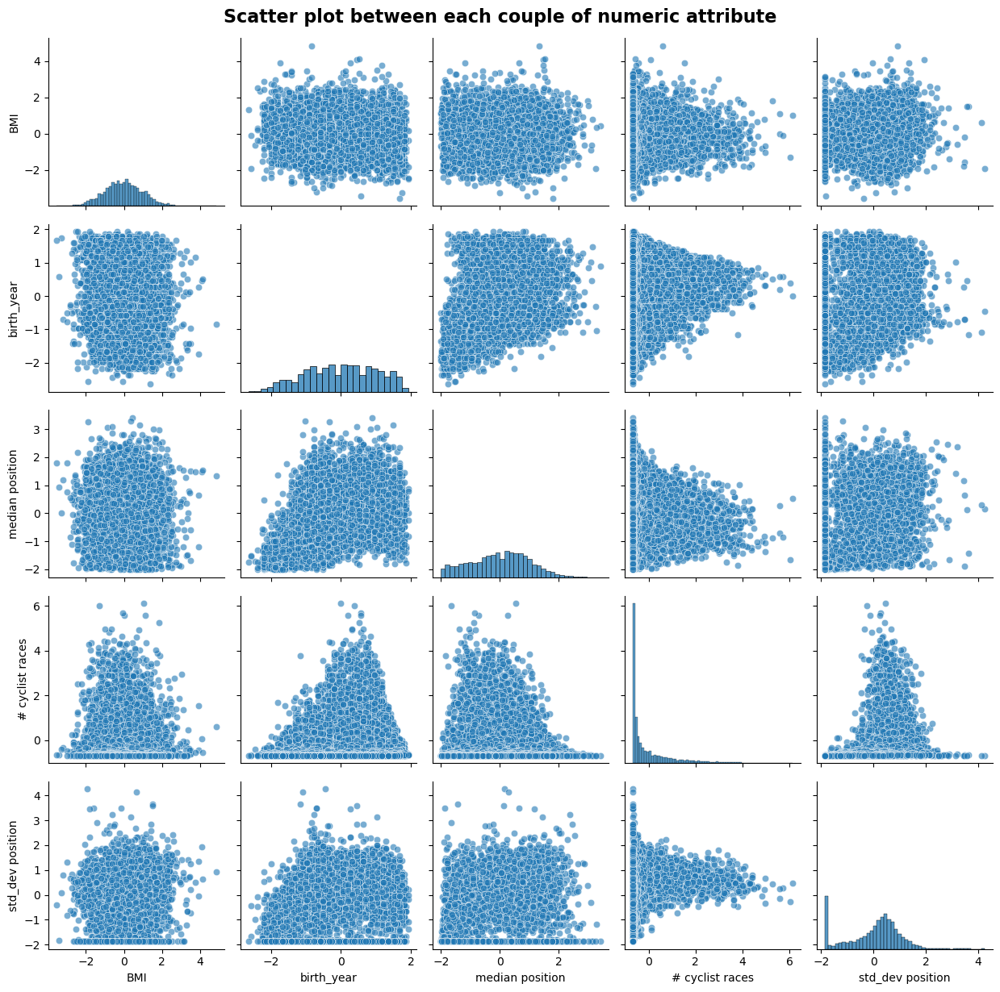

In [61]:
pairplot=sbn.pairplot(std_numeric_cyclists[columns], plot_kws={'alpha': 0.6})
pairplot.figure.suptitle("Scatter plot between each couple of numeric attribute", fontweight='bold', size=16)
pairplot.figure.tight_layout()
pairplot.figure.subplots_adjust(top=0.95)
plt.show()
plt.close()

As the scatter plot shows, in all the 2D sections of the multidimensional space (5), the points tend to form a single large cluster, so that it is difficult to identify other small clusters with different densities, due to the limitation of the algorithm itself.

In fact if there are groupings with different densities which are quite close each other, it is possible that an unique value of the _epsilon_ parameter could be not good for all the clusters hence they will merged in a single big cluster. <br>
It is possible to try other density-based algorithm like the:
- **HDBSCAN**, which is a variataion of the DBSCAN that does not require to specify an _eps_ value. In fact it performs DBSCAN over varying epsilon values and integrates the result to find a clustering that gives the best stability over epsilon. This allows HDBSCAN to find clusters of varying densities (unlike DBSCAN), and to be more robust to parameter selection. [Scikitlearn documentation](https://scikit-learn.org/1.5/modules/generated/sklearn.cluster.HDBSCAN.html)
- **OPTICS** [Scikitlearn documentation](https://scikit-learn.org/dev/modules/generated/sklearn.cluster.OPTICS.html#r2c55e37003fe-1)

### Optics (_Ordering Points To Identify Cluster Structure_)

In [62]:
columns=['BMI', 'birth_year', 'median position', '# cyclist races', 'std_dev position']

**Parameters of the OPTICS Algorithm:**
- min_samples: int > 1, default=5. Is the # of samples in a neighborhood for a point to be considered as a core point. (similar to dbscan). Small values will identify more clusters while high values will privilege bigger and well defined clusters (with the risk of absorbing small clusters).
- max_eps: float, default=np.inf. Maximum distance between two samples for one to be considered as in the neighborhood of the other. 
- metric: Metric to use for distance computation.
- xi: Is the cutoff for the reachability distance. Small values (0.01-0.05) can capture slight differences in density.

In [63]:
def OpticsPlots(cluster_labels, dataset, label_column, columns_for_clustering, min_samples_param, xi_param, min_cluster_size=None):
    # Define a consistent color palette for the clusters for all the following plots
    num_clusters = len(cluster_labels)
    palette = sbn.color_palette("bright", num_clusters)
    cluster_color_map = {label: palette[i] for i, label in enumerate(cluster_labels)}

    #-----PIE CHART-----

    # Create a pie chart showing the distribution of records between clusters
    cluster_counts = dataset[label_column].value_counts()  # Get counts per cluster
    cluster_colors = [cluster_color_map[label] for label in cluster_counts.index]  # Match colors to clusters

    fig, ax = plt.subplots()
    wedges, texts, autotexts = plt.pie(cluster_counts, explode= np.full(len(cluster_counts), 0.15), labels=None,
        autopct='%1.1f%%', startangle=90, pctdistance=0.8, colors=cluster_colors, wedgeprops={'edgecolor': 'black'})
    ax.legend(wedges, cluster_counts.index, title="Clusters", loc="center left", bbox_to_anchor=(1, 0.5))
    plt.title('Distribution of data objects between clusters', fontweight='bold')
    plt.show()

    #-----SCATTER PLOT WITH CLUSTER LABELS-----
        
    #Show the scatterplot between each numeric attribute of the original dataset, labeling using the cluster num
    pairplot=sbn.pairplot(dataset[columns_for_clustering+[label_column]], hue='cluster_num', palette=cluster_color_map)
    pairplot.figure.suptitle("Scatter plot between each couple of numeric attribute per cluster", fontweight='bold', size=16)
    pairplot.figure.text(0.5, 0.947, f"OPTICS parameters: xi={xi_param}, min_pts={min_samples_param}, min_clust_size={min_cluster_size}", ha='center', fontsize=10, style='italic')

    pairplot.fig.subplots_adjust(bottom=0.8)  # Adjust the bot margin to make space for the legend
    pairplot.figure.tight_layout()
    pairplot.figure.subplots_adjust(top=0.9)  # Adjust top margin to make space for the titles
    plt.show()
    plt.close()

In [64]:
def OPTICSIteration(std_dataset, dataset, columns_for_clustering, m='euclidean', plots=False, xi_param=0.05, min_samples_param=5, min_cluster_size_param=None):
    #OPTICS: It's an algorithm similar to DBSCAN which is albe to identify clusters of different densities/shape.
    # It builds a density-based representation of the data by creating an ordered list of points called reachability plot.
    # Each point in the list is associated with a reachability distance, which is a measure of how easy it is to reach that
    # point from other points in the dataset. Points with similar reachability distances are more likely to be in the same cluster.

    # Params:
    # min_samples: int > 1, default=5 = # of samples in a neighborhood for a point to be considered as a core point. (similar to dbscan)
    # max_eps: float, default=np.inf. Maximum distance between two samples for one to be considered as in the neighborhood of the other.
    # metric: Metric to use for distance computation
    # xi: cutoff for the reachability distance


    # Execute the OPTICS Algorithm
    print(f"----- OPTICS Execution (min_sample={min_samples_param}, xi={xi_param}, min_cluster_size={min_cluster_size_param})-----")
    optics = OPTICS(min_samples=min_samples_param, xi=xi_param, metric=m, min_cluster_size=min_cluster_size_param)
    optics.fit(std_dataset)

    #Print the number of clusters with relative sizes
    unique_labels, counts = np.unique(optics.labels_, return_counts=True)
    print("Clustering composition:")
    for label, count in zip(unique_labels, counts): #zip yields tuples until the input is finished
        if label == -1:
            print(f"\tNoise: {count} points")
        else:
            print(f"\tCluster #{label}: {count} points")

    #Determine the silhouette score
    labels_filtered = optics.labels_[optics.labels_ != -1]
    data_filtered = std_dataset[optics.labels_ != -1]
    if(len(np.unique(optics.labels_))>2): #silhouette not determinable with only 1 cluster
        print(f"Silhouette score without noise: {silhouette_score(data_filtered, labels_filtered, metric=m)}")
        print(f"Silhouette score: {silhouette_score(std_dataset, optics.labels_, metric=m)}")

    #Assign a label to each record of the original dataset
    dataset['cluster_num'] = optics.labels_

    if plots:
        OpticsPlots(unique_labels, dataset, 'cluster_num', columns_for_clustering, min_samples_param, xi_param, min_cluster_size_param)
    
        # Reachability graph: points on the X axis sorted according to the cluster label and the reachability distance 
        # of each point to its core point on the Y axis,
        reachability = optics.reachability_[optics.ordering_]
        plt.figure(figsize=(10, 6))
        plt.plot(reachability, color='blue')
        plt.title(r'Reachability plot $\it{OPTICS}$ algorithm', fontweight='bold')
        plt.xlabel('Order')
        plt.ylabel('Reachability distance')
        plt.show()
        
    #return the labels in order to compute some statistics on the cluster
    return optics.labels_

----- OPTICS Execution (min_sample=8, xi=0.075, min_cluster_size=None)-----
Clustering composition:
	Noise: 5654 points
	Cluster #0: 14 points
	Cluster #1: 9 points
	Cluster #2: 9 points
	Cluster #3: 17 points
	Cluster #4: 8 points
	Cluster #5: 15 points
	Cluster #6: 10 points
	Cluster #7: 18 points
	Cluster #8: 20 points
	Cluster #9: 9 points
	Cluster #10: 10 points
	Cluster #11: 10 points
	Cluster #12: 13 points
	Cluster #13: 11 points
	Cluster #14: 8 points
	Cluster #15: 14 points
	Cluster #16: 8 points
	Cluster #17: 8 points
	Cluster #18: 15 points
	Cluster #19: 9 points
	Cluster #20: 18 points
	Cluster #21: 13 points
	Cluster #22: 11 points
	Cluster #23: 9 points
	Cluster #24: 16 points
	Cluster #25: 8 points
	Cluster #26: 11 points
	Cluster #27: 13 points
	Cluster #28: 9 points
	Cluster #29: 14 points
	Cluster #30: 22 points
	Cluster #31: 9 points
	Cluster #32: 15 points
	Cluster #33: 14 points
	Cluster #34: 12 points
	Cluster #35: 12 points
Silhouette score without noise: 0.7665

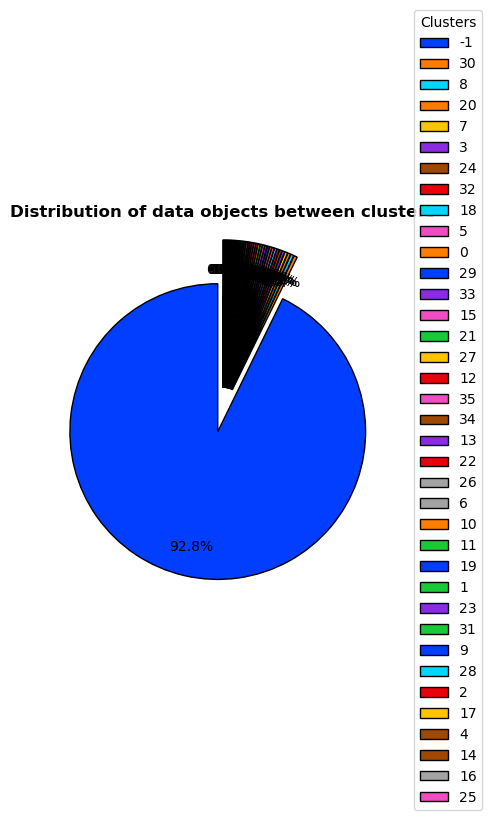

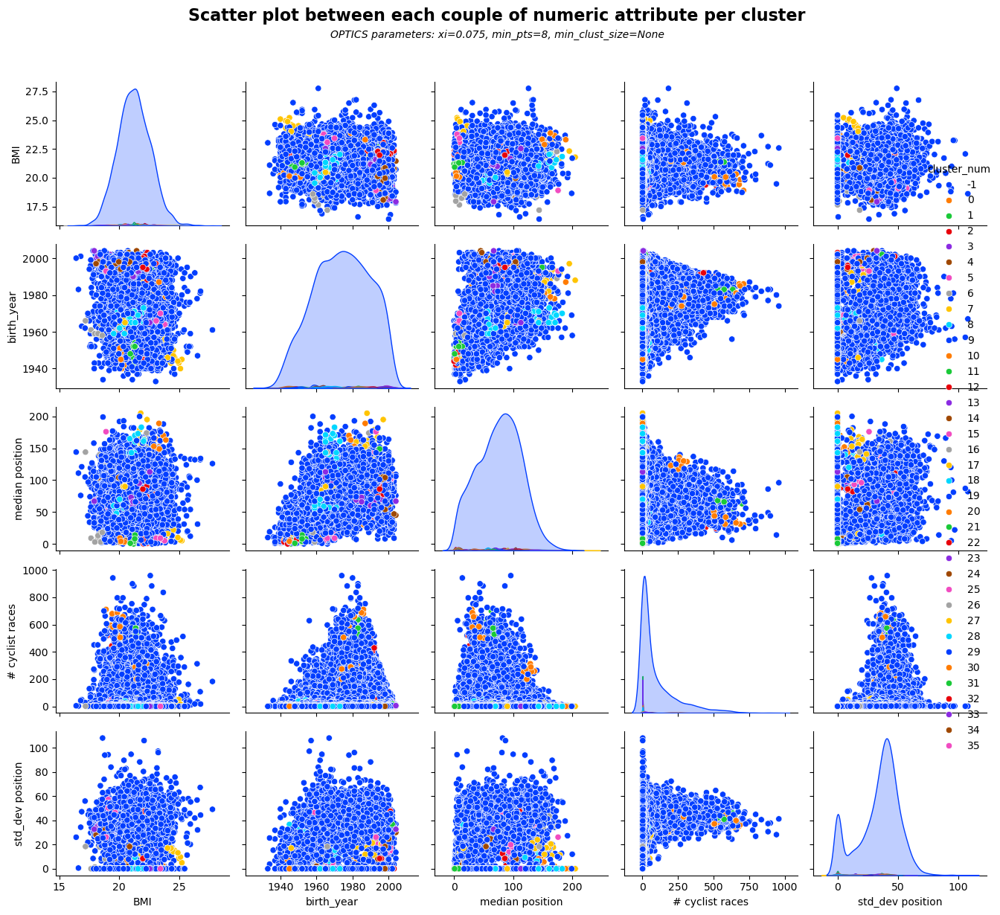

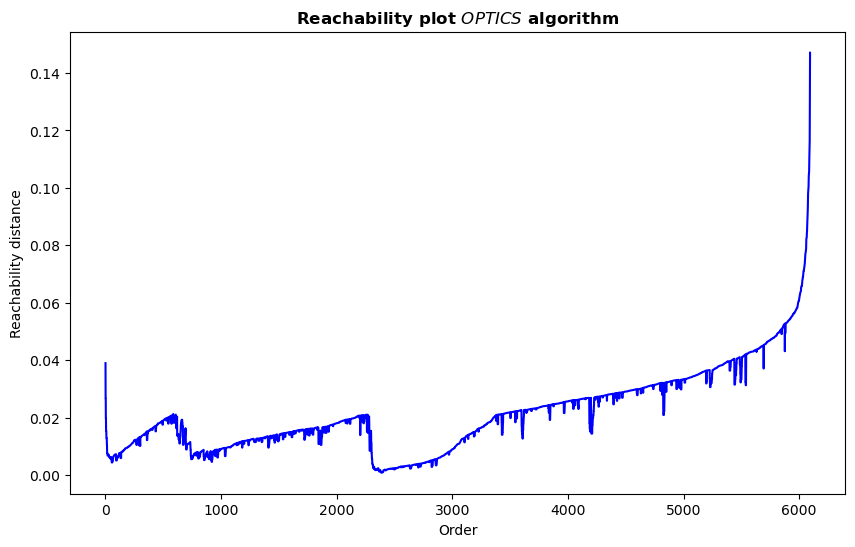

array([-1, -1, -1, ..., -1, -1, -1])

In [65]:
OPTICSIteration(std_numeric_cyclists, cyclists, columns, plots=True, min_samples_param=8, xi_param=0.075, m='cosine')

In [66]:
#increase xi to 
OPTICSIteration(std_numeric_cyclists, cyclists, columns, plots=False, min_samples_param=8, xi_param=0.015, m='cosine')

----- OPTICS Execution (min_sample=8, xi=0.015, min_cluster_size=None)-----
Clustering composition:
	Noise: 5021 points
	Cluster #0: 8 points
	Cluster #1: 15 points
	Cluster #2: 18 points
	Cluster #3: 9 points
	Cluster #4: 8 points
	Cluster #5: 14 points
	Cluster #6: 9 points
	Cluster #7: 11 points
	Cluster #8: 8 points
	Cluster #9: 9 points
	Cluster #10: 10 points
	Cluster #11: 11 points
	Cluster #12: 17 points
	Cluster #13: 21 points
	Cluster #14: 13 points
	Cluster #15: 30 points
	Cluster #16: 10 points
	Cluster #17: 13 points
	Cluster #18: 30 points
	Cluster #19: 21 points
	Cluster #20: 21 points
	Cluster #21: 9 points
	Cluster #22: 16 points
	Cluster #23: 11 points
	Cluster #24: 22 points
	Cluster #25: 12 points
	Cluster #26: 9 points
	Cluster #27: 8 points
	Cluster #28: 18 points
	Cluster #29: 14 points
	Cluster #30: 13 points
	Cluster #31: 12 points
	Cluster #32: 8 points
	Cluster #33: 11 points
	Cluster #34: 8 points
	Cluster #35: 15 points
	Cluster #36: 8 points
	Cluster #37: 

array([-1, -1, -1, ..., -1, -1, -1])

We can observe that those iterations of the OPTICS algorithm allowed us to find an high number of clusters with a good silhouette. However over 90% of points are classified as noise hence the very high silhouette value, determined by excluding the noise points, is not meaningful. The reachability graph confirms that the points are in a dense region, since the reachability distance is low, but many points are classified as noise. The fact that there are no distinct valleys in the graph suggests that the clusters are not distinct, so density-based algorithms may be limited in identifying them.

## Races

Let's apply the clustering algorithm to the races dataset, in order to find similar races. <br>

Since '_std delta_' and '_median delta_' are higly correlated, we decided to maintain only the median delta for the clustering. Also '_lenght_' and '_climb total_' are correlated so we choose to keep '_lenght_'. '_points_' and '_lenght_' have a correlation of 0.44, so a moderate one, but we at the moment we do not make any feature cutting.

In [67]:
numeric_races.columns

Index(['points', 'length', 'climb_total', 'startlist_quality', 'climb/length',
       'median_delta', 'std_delta'],
      dtype='object')

In [68]:
numeric_races.corr()

,points,length,climb_total,startlist_quality,climb/length,median_delta,std_delta
points,1.000000,0.443516,0.222756,0.150270,-0.064540,0.035331,0.051223
length,0.443516,1.000000,0.590508,0.075864,-0.171295,0.075307,0.117848
climb_total,0.222756,0.590508,1.000000,0.095901,0.430213,0.303302,0.301224
startlist_quality,0.150270,0.075864,0.095901,1.000000,0.015309,0.096597,0.069962
climb/length,-0.064540,-0.171295,0.430213,0.015309,1.000000,0.191377,0.223502
median_delta,0.035331,0.075307,0.303302,0.096597,0.191377,1.000000,0.793629
std_delta,0.051223,0.117848,0.301224,0.069962,0.223502,0.793629,1.000000


In [69]:
columns=['points', 'length', 'startlist_quality', 'median_delta', 'climb/length']

In [70]:
std_numeric_races[columns].head()

,points,length,startlist_quality,median_delta,climb/length
0,0.171536,-0.054293,0.663219,-0.332395,-0.759354
1,-0.154268,0.446565,-0.440839,1.655025,1.508052
2,0.171536,-0.555152,1.867167,-0.330335,-0.832122
3,-0.642976,-2.321415,-0.485527,-0.305621,-0.591897
4,0.171536,0.400899,1.478119,1.056740,0.561182


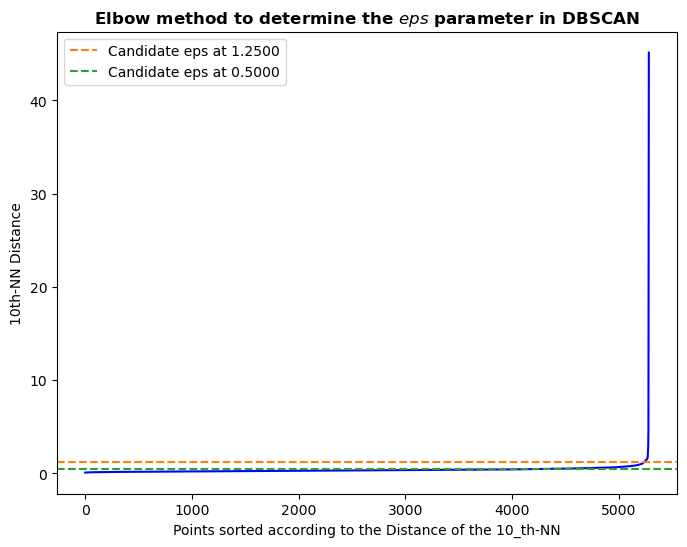

In [75]:
#Starting point min_pts=2*dimensionality
ElbowMethodForDBSCAN(10, std_numeric_races[columns], horizontal_lines=[1.25, 0.5])

----- DBSCAN Execution (eps=0.65, min_sample=10) -----
Clustering composition:
	Noise: 140 points (2.65%)
	Cluster #0: 4537 points (85.91%)
	Cluster #1: 254 points (4.81%)
	Cluster #2: 199 points (3.77%)
	Cluster #3: 92 points (1.74%)
	Cluster #4: 50 points (0.95%)
	Cluster #5: 9 points (0.17%)
Silhouette score without noise: 0.08277165022431651
Silhouette score: 0.06849396183705696


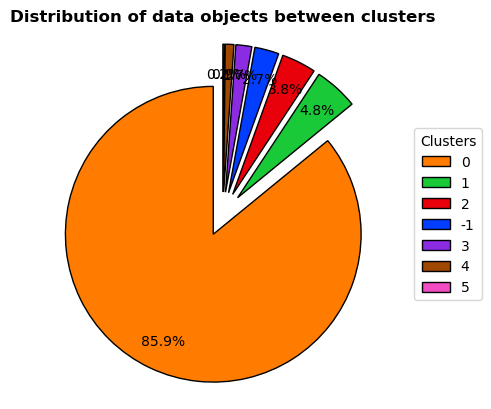

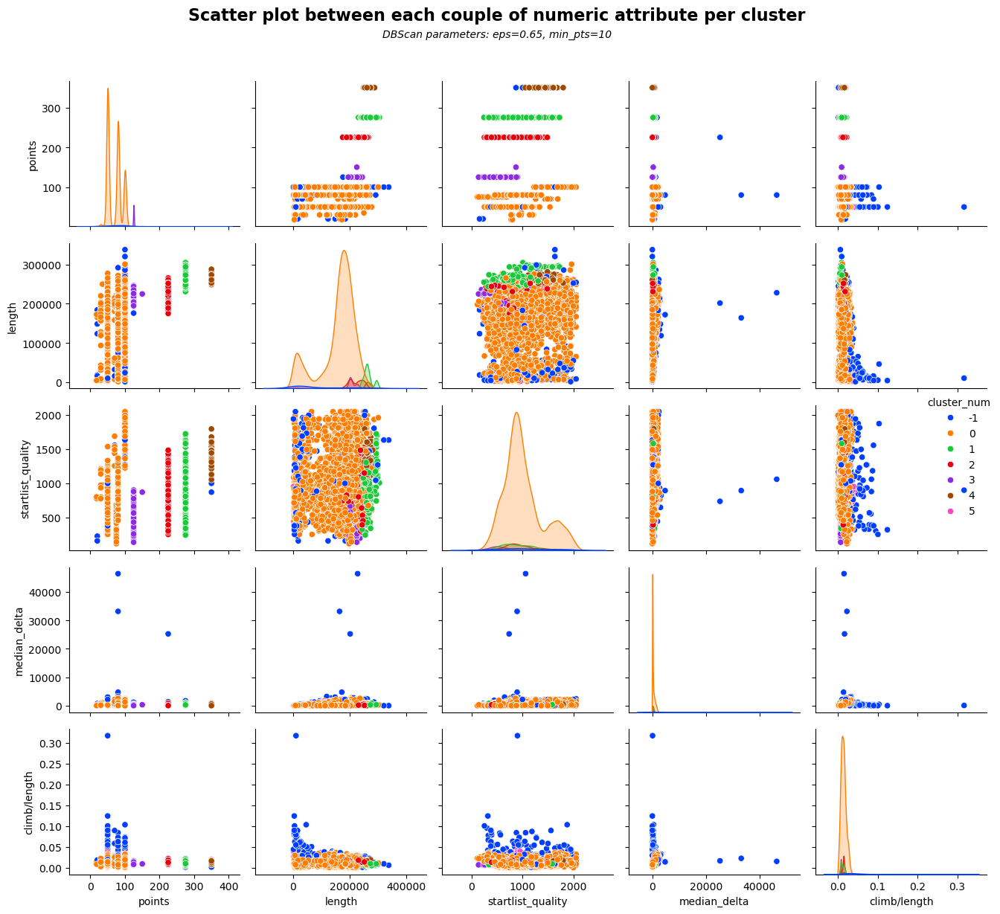

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [71]:
DBSCANIteration(0.65, 10, std_numeric_races[columns], races, columns, plots=True)

It seems that the clustering with _min pts_=10 may have a significance; The feature '_points_' allow us to generate more definite clusters. We can try to explore a range of candidate _epsilon_ without moving the min_pts parameter.

In [195]:
GridSearchDBSCAN(std_numeric_races[columns], 0.5, 1.25, 10, 11, 0.05)

Metric: manhattan Eps: 0.5 min_samples: 10 #Clusters: 17 Score: 0.1027

Metric: euclidean Eps: 0.5 min_samples: 10 #Clusters: 5 Score: 0.1170

Metric: manhattan Eps: 0.55 min_samples: 10 #Clusters: 14 Score: -0.0405

Metric: euclidean Eps: 0.55 min_samples: 10 #Clusters: 5 Score: 0.1103

Metric: manhattan Eps: 0.6 min_samples: 10 #Clusters: 13 Score: 0.1248

Metric: euclidean Eps: 0.6 min_samples: 10 #Clusters: 5 Score: 0.1057

Metric: manhattan Eps: 0.65 min_samples: 10 #Clusters: 9 Score: 0.0454

Metric: euclidean Eps: 0.65 min_samples: 10 #Clusters: 6 Score: 0.0828

Metric: manhattan Eps: 0.7 min_samples: 10 #Clusters: 7 Score: 0.0759

Metric: euclidean Eps: 0.7 min_samples: 10 #Clusters: 6 Score: 0.0991

Metric: manhattan Eps: 0.75 min_samples: 10 #Clusters: 7 Score: 0.0075

Metric: euclidean Eps: 0.75 min_samples: 10 #Clusters: 5 Score: 0.3292

Metric: manhattan Eps: 0.8 min_samples: 10 #Clusters: 7 Score: 0.0947

Metric: euclidean Eps: 0.8 min_samples: 10 #Clusters: 5 Score: 0.32

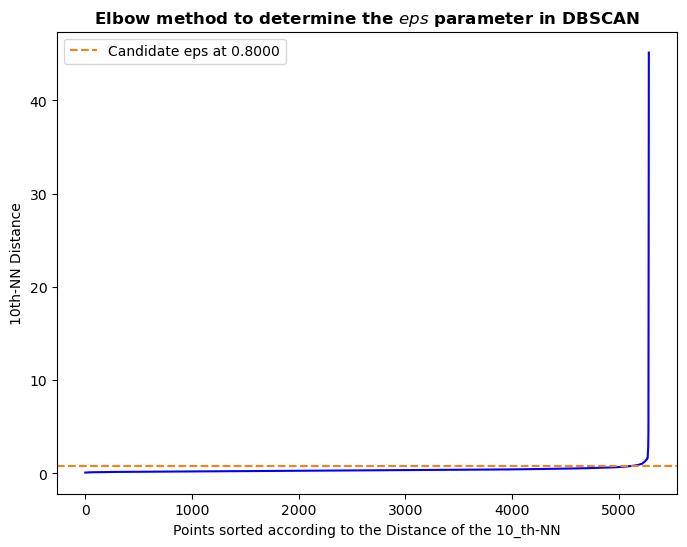

In [72]:
#Let's try this configuration --> Metric: euclidean Eps: 0.8 min_samples: 10 #Clusters: 5 Score: 0.3275
#It has a lower silhouette but produces a greater number of clusters (5 instead of 3)
ElbowMethodForDBSCAN(10, std_numeric_races[columns], horizontal_lines=[0.8])

----- DBSCAN Execution (eps=0.8, min_sample=10) -----
Clustering composition:
	Noise: 67 points (1.27%)
	Cluster #0: 4693 points (88.87%)
	Cluster #1: 255 points (4.83%)
	Cluster #2: 199 points (3.77%)
	Cluster #3: 53 points (1.0%)
	Cluster #4: 14 points (0.27%)
Silhouette score without noise: 0.327523852723399
Silhouette score: 0.3169696904232984


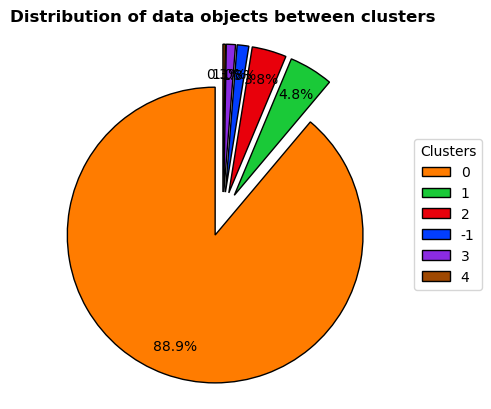

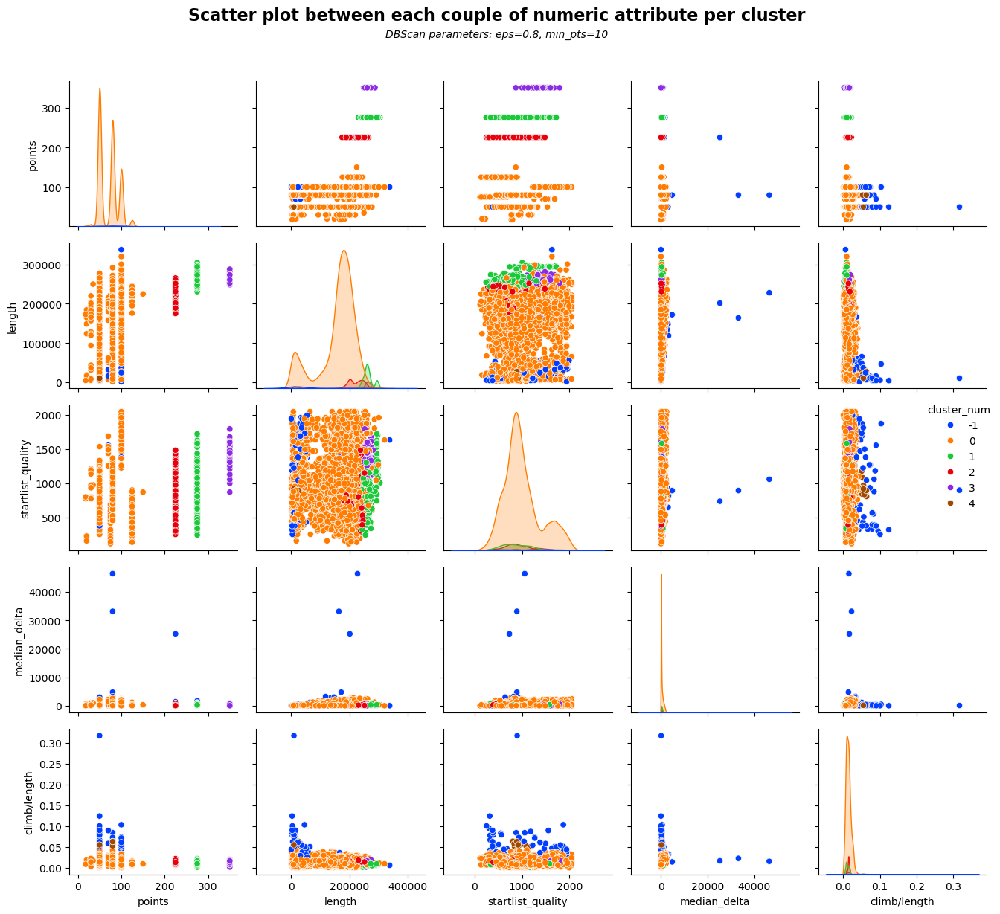

In [73]:
cluster_labels= DBSCANIteration(0.8, 10, std_numeric_races[columns], races, columns, plots=True)

From this plot we can see that the noisy points that are furthest away from the other clusters describe races in which:
- the 'total climb/length' ratio is above 3%.
- the median delta is very high,
- the lenght is very low, as in the case of _prologue_ races explained in the data understanding notebook, or very high as in the case of the _result_ races.

In [74]:
std_numeric_races.columns

Index(['points', 'length', 'climb_total', 'startlist_quality', 'climb/length',
       'median_delta', 'std_delta'],
      dtype='object')

In [75]:
def characterize_clusters(dataframe, cluster_column, metrics, excludeNoise=True):
    # cluster_column is the column of cluster labels
    
    # Extraction of numerical features and group by cluster
    filtered_df=dataframe.select_dtypes(include=[np.number])

    #If specified do not compute statistics for the noise class
    if excludeNoise:
        filtered_df=filtered_df[cluster_column!=-1]
        cluster_column=cluster_column[cluster_column!=-1]

    #Determine the stats and round for better interpretability
    grouped = filtered_df.groupby(cluster_column)
    summary_stats = grouped.agg(metrics)
    summary_stats = summary_stats.round(2)

    # Clusters and metrics as columns, features as rows
    summary_stats = summary_stats.stack(level=0).unstack(level=0)
    
    return summary_stats

In [76]:
stats=characterize_clusters(numeric_races, cluster_labels, ['median', 'min', 'max','std'])
stats

C:\Users\simon\AppData\Local\Temp\ipykernel_23624\1000016881.py:18: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  summary_stats = summary_stats.stack(level=0).unstack(level=0)


median                                             \
                           0          1          2          3         4   
climb/length            0.01       0.01       0.01       0.01      0.06   
climb_total          2081.00    2696.00    3257.00    3689.00    835.50   
length             175000.00  261000.00  227000.00  265500.00  15050.00   
median_delta           85.00     323.00     211.00     141.00    203.25   
points                 80.00     275.00     225.00     350.00     80.00   
startlist_quality     920.00     836.00     854.00    1353.00    891.50   
std_delta             121.89     298.71     228.07     251.52     79.77   

                      min                                                max  \
                        0         1          2         3        4          0   
climb/length          0.0       0.0       0.01       0.0     0.05       0.04   
climb_total           2.0     310.0    1213.00     401.0   425.00    6974.00   
length             1150.0  231000.0  175000.00  248670.0  6800.00  320500.00   
median_delta          0.0       0.0       0.00       9.0    16.00    2825.00   
points               18.0     275.0     225.00     350.0    50.00     150.00   
startlist_quality   115.0     241.0     250.00     869.0   803.00    2047.00   
std_delta             0.0       0.0       0.00       4.2    11.44   14981.86   

                                                                   std  \
                           1          2          3         4         0   
climb/length            0.02       0.02       0.02      0.06      0.01   
climb_total          5236.00    4793.00    5319.00   1679.00   1319.17   
length             305000.00  265700.00  288000.00  29600.00  63261.12   
median_delta         1008.00     838.50     886.00    573.00    482.88   
points                275.00     225.00     350.00     80.00     21.26   
startlist_quality    1723.00    1483.00    1794.00   1177.00    383.88   
std_delta             870.79     465.70     676.58    205.98    366.27   

                                                         
                          1         2        3        4  
climb/length           0.00      0.00     0.00     0.00  
climb_total          973.32    712.66  1089.31   445.78  
length             15872.16  22983.20  7935.68  7347.07  
median_delta         223.62    178.91   214.52   177.71  
points                 0.00      0.00     0.00    10.89  
startlist_quality    296.20    248.38   184.70   106.90  
std_delta            129.65     88.03   129.47    63.48

In [77]:
numeric_races['label']=cluster_labels
numeric_races.columns

Index(['points', 'length', 'climb_total', 'startlist_quality', 'climb/length',
       'median_delta', 'std_delta', 'label'],
      dtype='object')

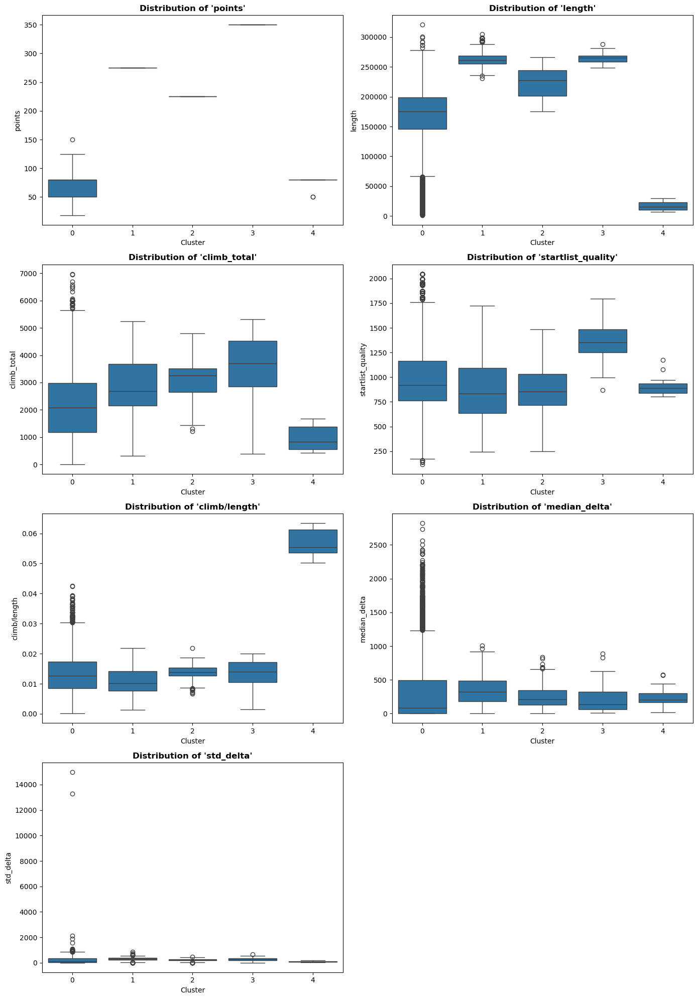

In [79]:
# Remove the contribution of the noise cluster
clusters_conditional_box_plot(numeric_races[numeric_races['label']!=-1], 'label')

In [80]:
numeric_races[numeric_races['label']==0]['points'].unique()

array([100,  80,  50,  20, 125,  75,  70,  30, 150,  35,  18], dtype=int64)

In [84]:
numeric_races[numeric_races['label']==4]['points'].unique()

array([80, 50], dtype=int64)

_General observations_
- The clusters 1, 2, 3 comprises long races, in fact they have the greatest median lenght, mininum lenght and the standard deviation of the deltas.
- In clusters 1, 2, 3, 4 there is no variability in the climb/lenght values since the standard deviation is 0, but also in the cluster 1 the variability is very low. 
- Cluster 1,2 and 3 comprises races with the same value of points, respectively 275, 225, 350.
- Cluster 3 contains races with an higher median startlist quality value.

_Cluster characterization_
- Cluster 3, like Cluster 1, contains the longest races, with the highest points and the highest startlist quality. So we can assume that these are the most prestigious races, which give more points compared to the others and in which many good cyclists/teams participate. 
- Cluster 0 contains races with different characteristics, as it is the most populated cluster. These races have a low score (range 18-125). With regard to the features _length_, _climb total_, _startlist quality_ and _median delta_ this cluster shows an high variability, in particular there are races with a very high median delta. 
- Cluster 1 contains races the longest races with an associated point value of 275. The median climb/length ratio is the lowest of all the clusters.
- Cluster 2 contains races that are quite long compared to those in cluster 0 and cluster 1. Regarding the climb/lenght ratio the cluster 2 has the shortest range of values, between about 0.1 and 0.2.
- Cluster 4 is the smallest and contains the shortest races, with lengths less than 50km (such as the _prologo_ races). Moreover, these races are also races with the lowest values of points (80 and 50).

In [85]:
from sklearn.metrics.pairwise import pairwise_distances

In [91]:
#Determine the distance of each couple of points (by default 'euclidean')
proximity_matrix = pairwise_distances(numeric_races)
n = len(cluster_labels)
#matrix[i, j]==1 if point i and point j belong to the same cluster
ideal_similarity_matrix = np.zeros((n, n), dtype=int) #fill all positions with zeros
for i in range(n):
    for j in range(n):
        if cluster_labels[i] == cluster_labels[j] and cluster_labels[i] != -1:  # Ignora il rumore
            ideal_similarity_matrix[i, j] = 1

In [93]:
from scipy.stats import pearsonr
# pearsonr requires two array_like inputs. ravel returns a 1-D array of the inputs
proximity_vector = proximity_matrix.ravel()
ideal_similarity_vector = ideal_similarity_matrix.ravel()
correlation, _ = pearsonr(proximity_vector, ideal_similarity_vector)
print(f"Pearson correlation between the proximity matrix and the ideal similarity matrix:{correlation:.4f}")

Pearson correlation between the proximity matrix and the ideal similarity matrix:-0.1971


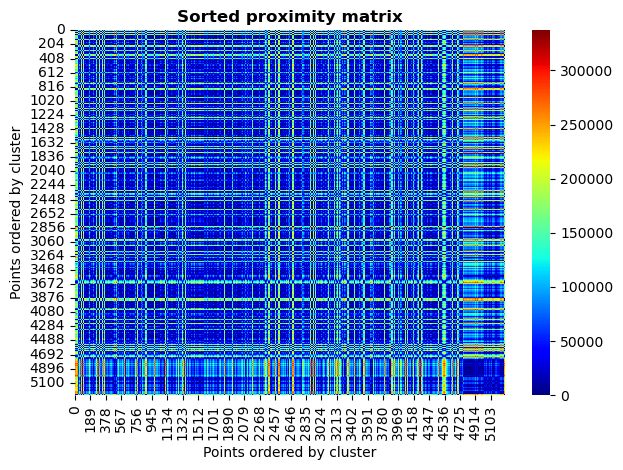

In [95]:
sorted_indices = np.argsort(cluster_labels)  # Ordina in base ai cluster
sorted_proximity_matrix = proximity_matrix[sorted_indices, :][:, sorted_indices]
sbn.heatmap(sorted_proximity_matrix, cmap="jet", cbar=True)
plt.title("Sorted proximity matrix", fontweight='bold')
plt.xlabel("Points ordered by cluster")
plt.ylabel("Points ordered by cluster")
plt.tight_layout()
plt.show()
plt.close()

The **proximity matrix** contains the distance, in our case _Euclidean_, between each pair of data. The **ideal similarity matrix** contains a 1 in position (_i_, _j_) if the data _i_ and the data _j_ belong to the same cluster. An high correlation between these two matrices indicates that, ideally, points that belong to the same cluster are close each other. Even if it is not the best measure for evaluating density based clusterings, the very low correlation between the two matrices and the not block-diagonal shape of the heatmap confirms that the clusters are not well-separated.

Let's try increase the min points parameter to capture denser clusters.

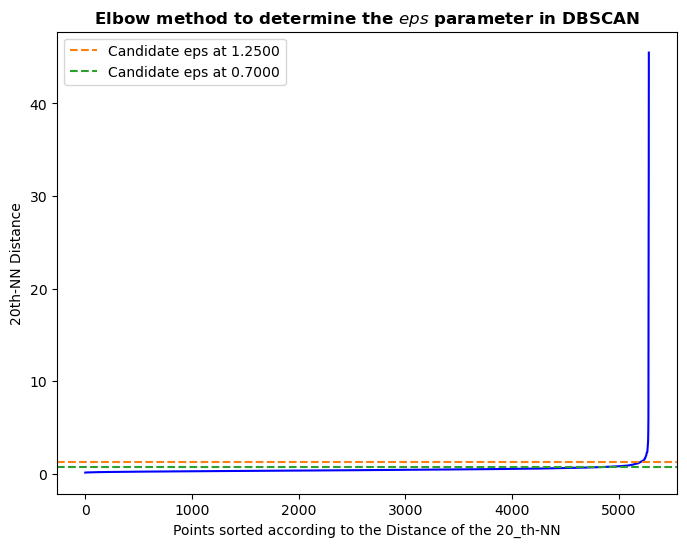

In [96]:
ElbowMethodForDBSCAN(20, std_numeric_races[columns], horizontal_lines=[1.25, 0.7])

----- DBSCAN Execution (eps=0.8, min_sample=20) -----
Clustering composition:
	Noise: 106 points (2.01%)
	Cluster #0: 4670 points (88.43%)
	Cluster #1: 255 points (4.83%)
	Cluster #2: 199 points (3.77%)
	Cluster #3: 51 points (0.97%)
Silhouette score without noise: 0.33405669396357923
Silhouette score: 0.3266613280263917


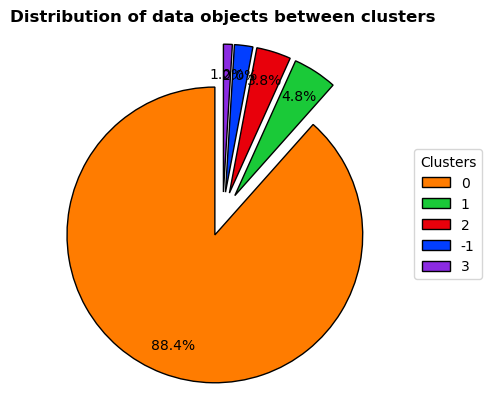

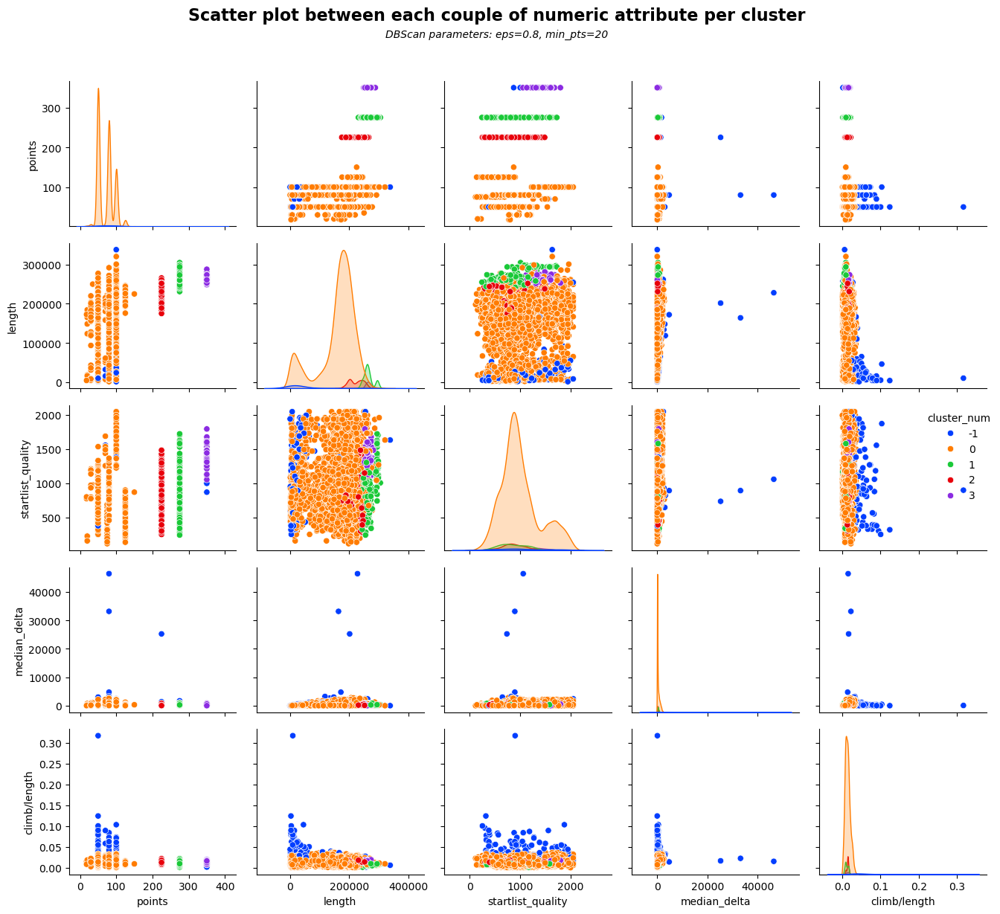

In [97]:
cluster_labels= DBSCANIteration(0.8, 20, std_numeric_races[columns], races, columns, plots=True)

Actually we have a lower number of clusters and the main one contais more points than before. <br>
Even in this situation the are regions of the multidimensional space with different densities, so the density based algorithm tends to produce a main big bluster with most of the points. However, for this dataset we were able to extract some groups of races with particular characteristics, thanks also to the '_points_' feature that allowed us to better separate the races.

In [99]:
from sklearn.decomposition import PCA

# Try to apply the PCA to get the optimal number of components
pca_instance=PCA(n_components=0.85) #preserve the 85% of the variance (we reduce 1 dimension)
pca_std_numeric_races=pca_instance.fit_transform(std_numeric_races[columns])

print(f"# of selected principal components: {pca_instance.n_components_}")

# of selected principal components: 4


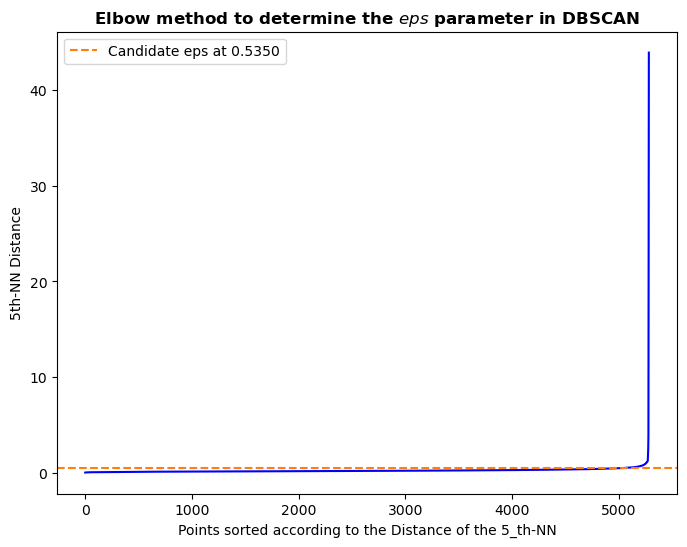

In [100]:
#min_pts=d+1
ElbowMethodForDBSCAN(5, pca_std_numeric_races, horizontal_lines=[0.535])

----- DBSCAN Execution (eps=0.5, min_sample=5) -----
Clustering composition:
	Noise: 125 points (2.37%)
	Cluster #0: 4628 points (87.63%)
	Cluster #1: 452 points (8.56%)
	Cluster #2: 48 points (0.91%)
	Cluster #3: 9 points (0.17%)
	Cluster #4: 5 points (0.09%)
	Cluster #5: 11 points (0.21%)
	Cluster #6: 3 points (0.06%)
Silhouette score without noise: 0.21543217953142435
Silhouette score: 0.19557020338916842


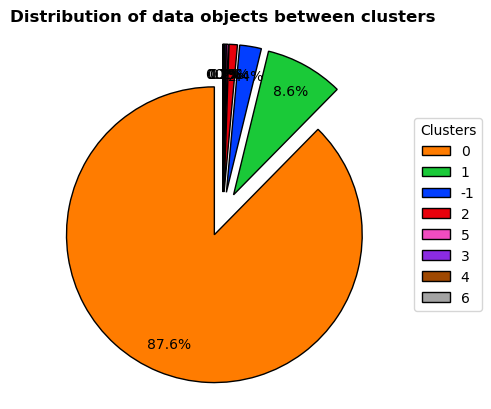

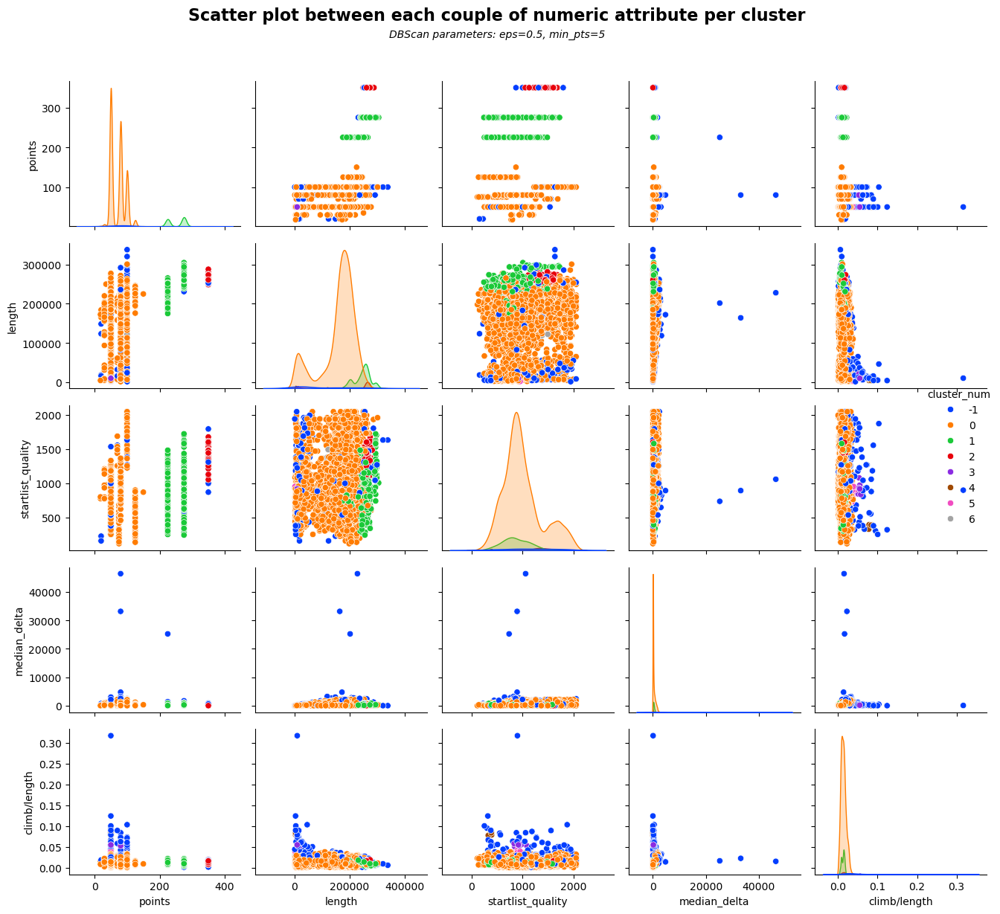

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [101]:
DBSCANIteration(0.5, 5, pca_std_numeric_races, races, columns, plots=True)

Also by applying the PCA we have obtained more or less clusters with the same meaning as before.

## Placements

In [102]:
numeric_placements.columns

Index(['position', 'cyclist_age', 'delta', 'year'], dtype='object')

In [103]:
numeric_placements.corr()

,position,cyclist_age,delta,year
position,1.000000,0.011970,0.236165,0.142047
cyclist_age,0.011970,1.000000,0.000472,0.152366
delta,0.236165,0.000472,1.000000,0.074633
year,0.142047,0.152366,0.074633,1.000000


There is not a significant correlation between these attributes so we do not cut any other feature.

In [104]:
placements.columns

Index(['position', 'cyclist', 'cyclist_age', 'cyclist_team', 'delta', 'date',
       '_url', 'year'],
      dtype='object')

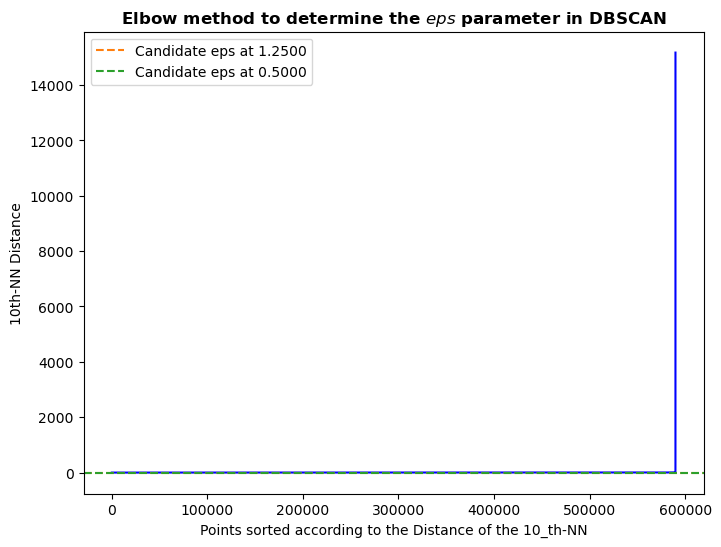

In [105]:
#Starting point min_pts=2*dimensionality
ElbowMethodForDBSCAN(10, numeric_placements[['cyclist_age', 'delta', 'year']], horizontal_lines=[1.25, 0.5])

In [107]:
#Starting point min_pts=2*dimensionality
#too much time consuming
#ElbowMethodForDBSCAN(1000, numeric_placements[['cyclist_age', 'delta', 'year']], horizontal_lines=[1.25, 0.5])

We notice that there are about 600000 points in the placements dataset, so it would make sense to sample the rows in case we want to do clustering in that direction. Actually the placements have only 3 numeric attributes of interest ['cyclist_age', 'delta', 'year'] (Position is a numeric with an order meaning, so it's not relevant to compute distances on this feature). At the moment, we do not think it makes sense to perform clustering on these rows because we won't capture anything relevant.